In [399]:
# Step 0. Load libraries and custom modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud
import re
from dateutil.parser import parse
from datetime import datetime
import random
from scipy import stats
import plotly.express as px
# ------------  PREPROCESING -------------
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.decomposition import FastICA
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import CountVectorizer
from nltk import bigrams, word_tokenize
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import QuantileTransformer
# Machine learning -----------------------------------------------------
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
# Metrics --------------------------------------------------------------
from sklearn.metrics import mean_squared_error, r2_score

# Dataset creation

In [260]:
# Load the Dataset
df_processed = pd.read_csv('../data/processed/df_processed.csv')

df_processed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15735 entries, 0 to 15734
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Unnamed: 0          15735 non-null  int64  
 1   review              15735 non-null  float64
 2   review_year         15735 non-null  int64  
 3   published_year      15735 non-null  int64  
 4   helpfulness         15735 non-null  float64
 5   fiction_category    15735 non-null  int64  
 6   top_publisher       15735 non-null  int64  
 7   text_clean          15735 non-null  object 
 8   text_complexity     15735 non-null  float64
 9   compound_sentiment  15735 non-null  float64
 10  word_count          15735 non-null  int64  
dtypes: float64(4), int64(6), object(1)
memory usage: 1.3+ MB


In [261]:
df_processed = df_processed.drop(['Unnamed: 0'], axis=1)

In [262]:
df_processed.sample(5, random_state=5)

,review,review_year,published_year,helpfulness,fiction_category,top_publisher,text_clean,text_complexity,compound_sentiment,word_count
499,5.0,2013,2008,1.00,1,0,loved book edge seat slow start really glad stuck,0.5,0.7109,9
13827,2.0,2005,2004,0.65,0,1,spin zone master latest venture advice kid disappointing platitude self serving phrase abound yet real substance offered help parent child face co...,6.8,0.8516,60
13444,5.0,2007,2005,1.00,0,0,read many book retirement investing first book made sense really simplifies stock market work talk common pitfallls investing tried found part wor...,11.3,0.9003,49
644,5.0,2011,2004,1.00,0,0,recently reread three book written george lightly edited helen papashvily anything happen george coming georgia caucasus good one begin thanks noa...,8.5,0.9186,44
12396,5.0,2005,2005,1.00,0,0,book easy read packed practical idea help delayed life decision read yet simple clear example paper clip absorbed painlessly graphic amusing lesso...,5.7,0.9460,30


In [263]:
ordered_columns = ['fiction_category', 'top_publisher', 'published_year', 'review_year', 'helpfulness', 'text_clean','compound_sentiment','text_complexity','word_count', 'review']

In [264]:
df_processed = df_processed[ordered_columns]

In [265]:
df_processed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15735 entries, 0 to 15734
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   fiction_category    15735 non-null  int64  
 1   top_publisher       15735 non-null  int64  
 2   published_year      15735 non-null  int64  
 3   review_year         15735 non-null  int64  
 4   helpfulness         15735 non-null  float64
 5   text_clean          15735 non-null  object 
 6   compound_sentiment  15735 non-null  float64
 7   text_complexity     15735 non-null  float64
 8   word_count          15735 non-null  int64  
 9   review              15735 non-null  float64
dtypes: float64(4), int64(5), object(1)
memory usage: 1.2+ MB


In [266]:
df_processed.sample(5, random_state=5)

,fiction_category,top_publisher,published_year,review_year,helpfulness,text_clean,compound_sentiment,text_complexity,word_count,review
499,1,0,2008,2013,1.00,loved book edge seat slow start really glad stuck,0.7109,0.5,9,5.0
13827,0,1,2004,2005,0.65,spin zone master latest venture advice kid disappointing platitude self serving phrase abound yet real substance offered help parent child face co...,0.8516,6.8,60,2.0
13444,0,0,2005,2007,1.00,read many book retirement investing first book made sense really simplifies stock market work talk common pitfallls investing tried found part wor...,0.9003,11.3,49,5.0
644,0,0,2004,2011,1.00,recently reread three book written george lightly edited helen papashvily anything happen george coming georgia caucasus good one begin thanks noa...,0.9186,8.5,44,5.0
12396,0,0,2005,2005,1.00,book easy read packed practical idea help delayed life decision read yet simple clear example paper clip absorbed painlessly graphic amusing lesso...,0.9460,5.7,30,5.0


In [267]:
df_final = df_processed.copy()
df_final.to_csv('../data/final/df_final.csv')

# Train Test Split


In [268]:
#Divide Data Set into Train Test Datasets
X = df_final.copy().drop(['review'], axis=1)
y = df_final['review'].copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=1530) #stratify: para definir los datasets de forma proporcional acorde a y.

X_train.sample(5, random_state=5)

,fiction_category,top_publisher,published_year,review_year,helpfulness,text_clean,compound_sentiment,text_complexity,word_count
5334,0,0,2005,2010,1.000,son adores book pull every night point picture trying say word great toddler book help learn say word learn read,0.8555,2.2,20
15053,0,0,2012,2012,1.000,ellie musical biographer set write semi famous amazingly talented black blue singer mabel beauvais right verge hitting big time mabel disappeared ...,-0.5498,8.0,215
7535,0,0,2007,2009,0.875,book written connecticut journalist certainly southern confederate sympathizer expose many dirty little secret north many way looked way came econ...,-0.2782,7.8,85
9498,1,0,2009,2011,1.000,love world eoin colfer created novel corporate takeover many aspect world speaks lot increasing amount power company wield would almost classify d...,0.9682,9.2,84
2515,1,0,2009,2012,1.000,excellent book high level concept felt enjoying book reading also getting feeling learning little something humanity,0.8225,8.0,16


In [269]:
df_train = X_train.copy()
df_train['review'] = y.copy()
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12588 entries, 3268 to 2317
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   fiction_category    12588 non-null  int64  
 1   top_publisher       12588 non-null  int64  
 2   published_year      12588 non-null  int64  
 3   review_year         12588 non-null  int64  
 4   helpfulness         12588 non-null  float64
 5   text_clean          12588 non-null  object 
 6   compound_sentiment  12588 non-null  float64
 7   text_complexity     12588 non-null  float64
 8   word_count          12588 non-null  int64  
 9   review              12588 non-null  float64
dtypes: float64(4), int64(5), object(1)
memory usage: 1.1+ MB


# Analysis and EDA for target feature

In [270]:
df_train['review'].value_counts()

review
5.0    7433
4.0    2569
3.0    1122
1.0     811
2.0     653
Name: count, dtype: int64

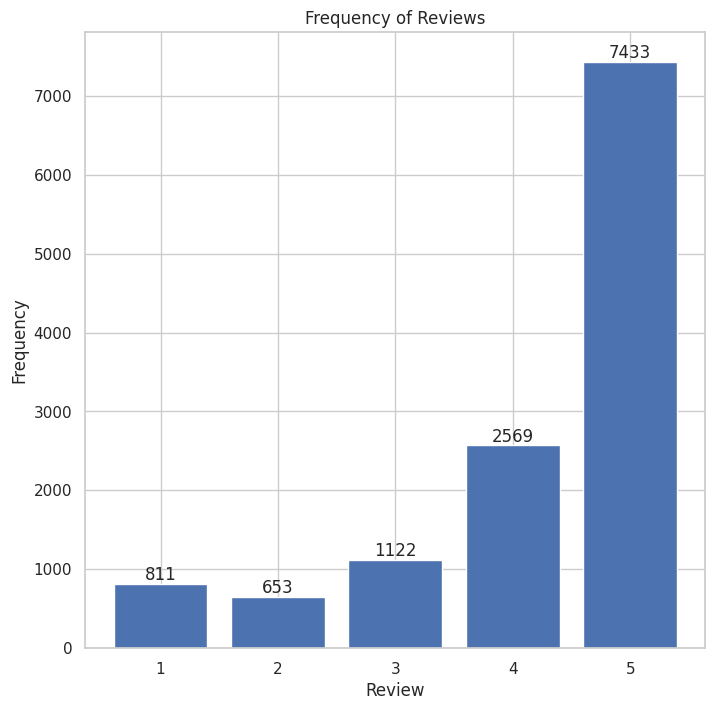

In [271]:
fig, ax = plt.subplots(figsize=(8, 8))
plt.grid(True)
bars = ax.bar(df_train['review'].value_counts(ascending=True).keys(), df_train['review'].value_counts(ascending=True))
ax.set_title('Frequency of Reviews')
ax.set_xlabel('Review')
ax.set_ylabel('Frequency')
ax.bar_label(bars)
plt.show()

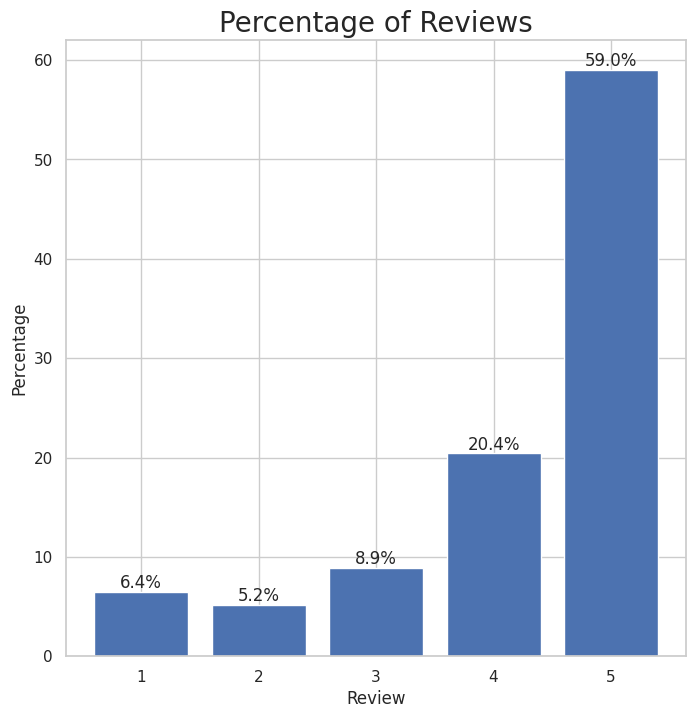

In [272]:
#Show a barplot by Percentages
fig, ax = plt.subplots(figsize=(8, 8))
bars = ax.bar(df_train['review'].value_counts(ascending=True).keys(), (df_train['review'].value_counts(ascending=True))/(df_train['review'].value_counts(ascending=True).sum())*100)

# Set the bar labels (percentages) to be displayed above the bars
ax.bar_label(bars, fmt='%.1f%%')
plt.grid(True)
plt.xlabel('Review')
plt.ylabel('Percentage')
plt.title('Percentage of Reviews', fontsize = 20)
plt.show()

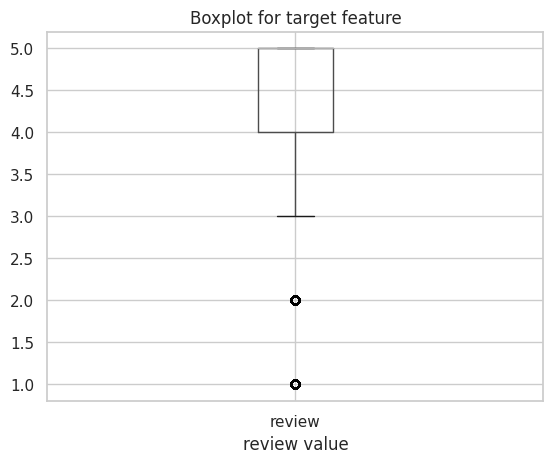

In [273]:
#Create a box plot to check for outliers, median and quartiles
df_train.boxplot(column='review')
plt.xlabel("review value")
plt.title("Boxplot for target feature")
plt.show()

In [274]:
df_train['review'].describe().T

count    12588.000000
mean         4.204322
std          1.193867
min          1.000000
25%          4.000000
50%          5.000000
75%          5.000000
max          5.000000
Name: review, dtype: float64

## Key Findings:
- The Dataset is unbalanced. Having 79.4% of the entries with a High/Postive review [4, 5]. Only 11.6% of the entries have a Low/Negative review [1, 2]. And 8.9% of the entries reviews are neutral [3]
- The Dataset review target feature is biased. Having the 25% Quartile above 4, and 50% and 75% Quartiles on 5. 
- The entries on the dataset with a low review [1, 2] are considered as outliers on the boxplot.

# Univariate EDA

## Fiction Category

In [275]:
df_train['fiction_category'].unique()

array([0, 1])

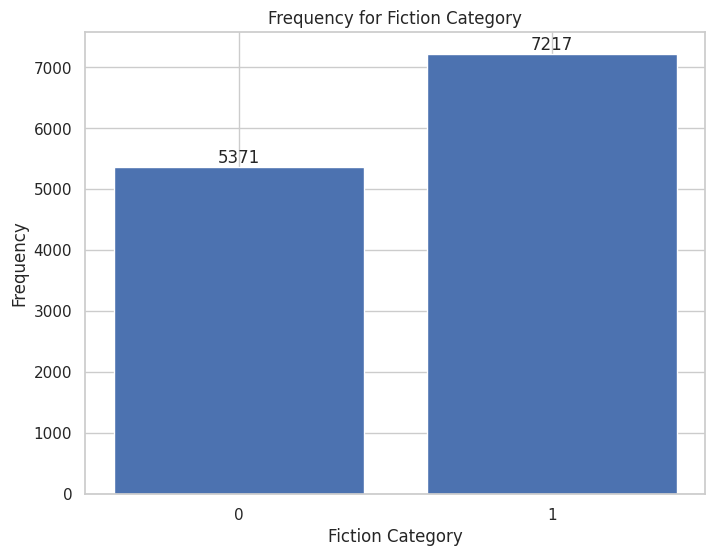

In [276]:
fig, ax = plt.subplots(figsize=(8, 6))
plt.grid(True)
binary_labels = [format(val, 'b') for val in df_train['fiction_category'].unique()]
bars = ax.bar(df_train['fiction_category'].unique(), height=df_train['fiction_category'].value_counts(ascending=True))
plt.xticks(df_train['fiction_category'].unique(), binary_labels)
ax.set_title('Frequency for Fiction Category')
ax.set_xlabel('Fiction Category')
ax.set_ylabel('Frequency')
ax.bar_label(bars)
plt.show()

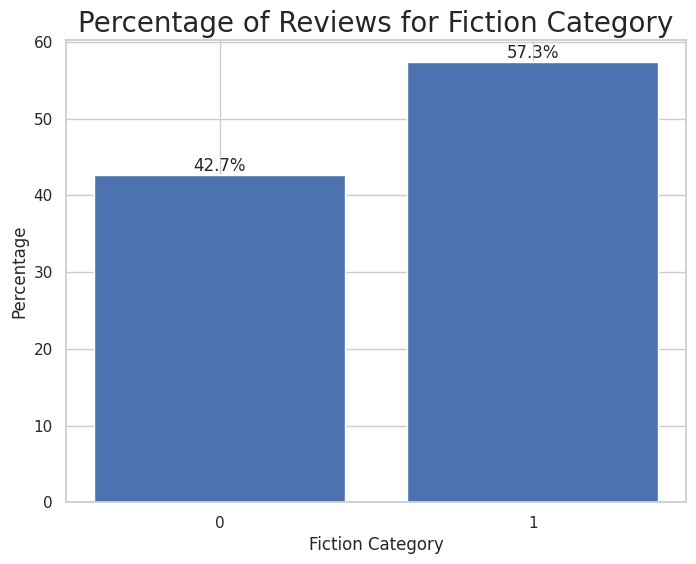

In [277]:
#Show a barplot by Percentages
category_percetage = df_train['fiction_category'].value_counts(ascending=True)/df_train['fiction_category'].value_counts(ascending=True).sum()*100

fig, ax = plt.subplots(figsize=(8, 6))
bars = ax.bar(df_train['fiction_category'].unique(), category_percetage)

# Set the bar labels (percentages) to be displayed above the bars
ax.bar_label(bars, fmt='%.1f%%')

plt.xticks(df_train['fiction_category'].unique(), binary_labels)
plt.xlabel('Fiction Category')
plt.ylabel('Percentage')
plt.title('Percentage of Reviews for Fiction Category', fontsize = 20)
plt.show()

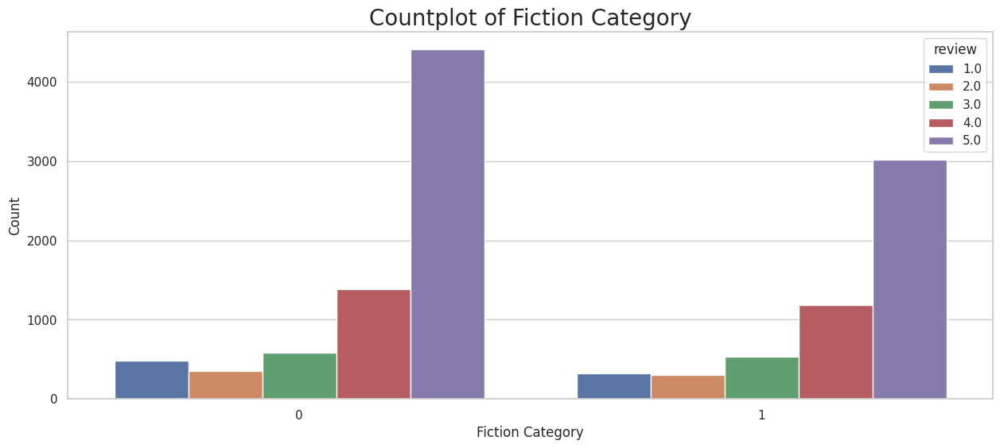

In [278]:
plt.figure(figsize=(15, 6))
plt.grid(True)
sns.countplot(data=df_train, x ='fiction_category', hue='review')
plt.xlabel('Fiction Category')
plt.ylabel('Count')
plt.title('Countplot of Fiction Category', fontsize = 20)
plt.show()

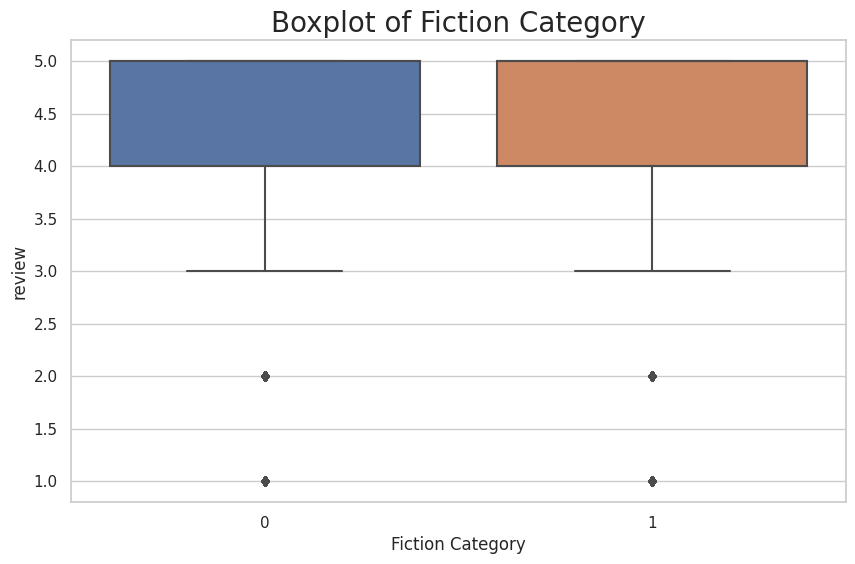

In [279]:
plt.figure(figsize=(10, 6))  # Set the figure size
plt.grid(True)
sns.boxplot(x='fiction_category', y='review', data=df_train)
plt.xlabel('Fiction Category')
plt.title('Boxplot of Fiction Category', fontsize = 20)
plt.show()

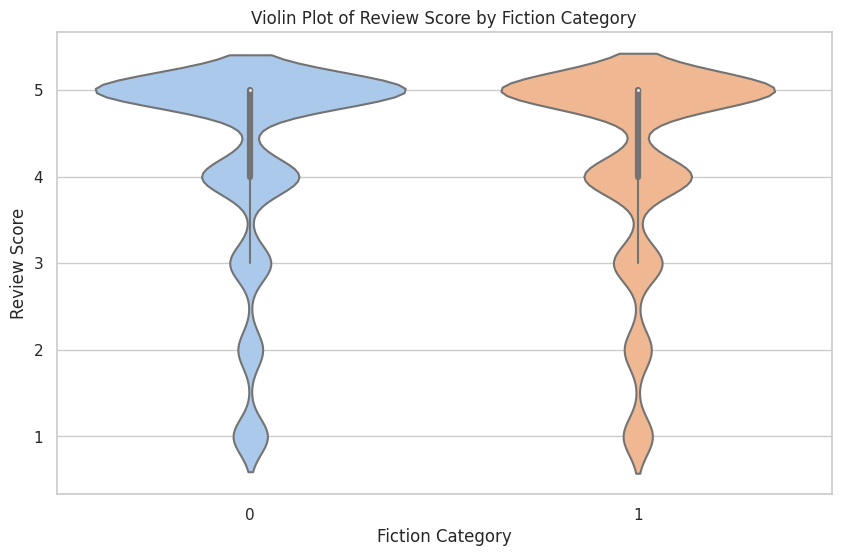

In [280]:
plt.figure(figsize=(10, 6))
plt.grid(True)
sns.violinplot(x='fiction_category', y='review', data=df_train, palette='pastel')
plt.xlabel('Fiction Category')
plt.ylabel('Review Score')
plt.title('Violin Plot of Review Score by Fiction Category')
plt.show()

### Key Findings for Categories:

- Fiction and Non-Fiction Categories contains reviews values in the 5 Review Socores [1, 2, 3, 4, 5]. All of the are biased to high review score.
- Fiction and Non-Fiction categories have the lower quartile limit in Rating of 4 and minimum values of 3, but with outliers in 1 and 2 score reviews groups.
- Fiction is most rated category. This category is biased to High review scores, having the median on 5. And the 25% quartile on 4.

## Published Year

In [281]:
pub_year = df_train[['published_year','review']]
pub_year.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12588 entries, 3268 to 2317
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   published_year  12588 non-null  int64  
 1   review          12588 non-null  float64
dtypes: float64(1), int64(1)
memory usage: 295.0 KB


In [282]:
pub_year = pub_year.groupby('published_year')['review'].agg(['mean', 'count']).reset_index()
pub_year

,published_year,mean,count
0,2004,4.140320,2309
1,2005,4.182574,2525
2,2006,4.055108,1615
3,2007,4.177352,1201
4,2008,4.251634,918
5,2009,4.259843,1270
6,2010,4.171941,948
7,2011,4.270106,659
8,2012,4.509567,993
9,2013,4.513333,150


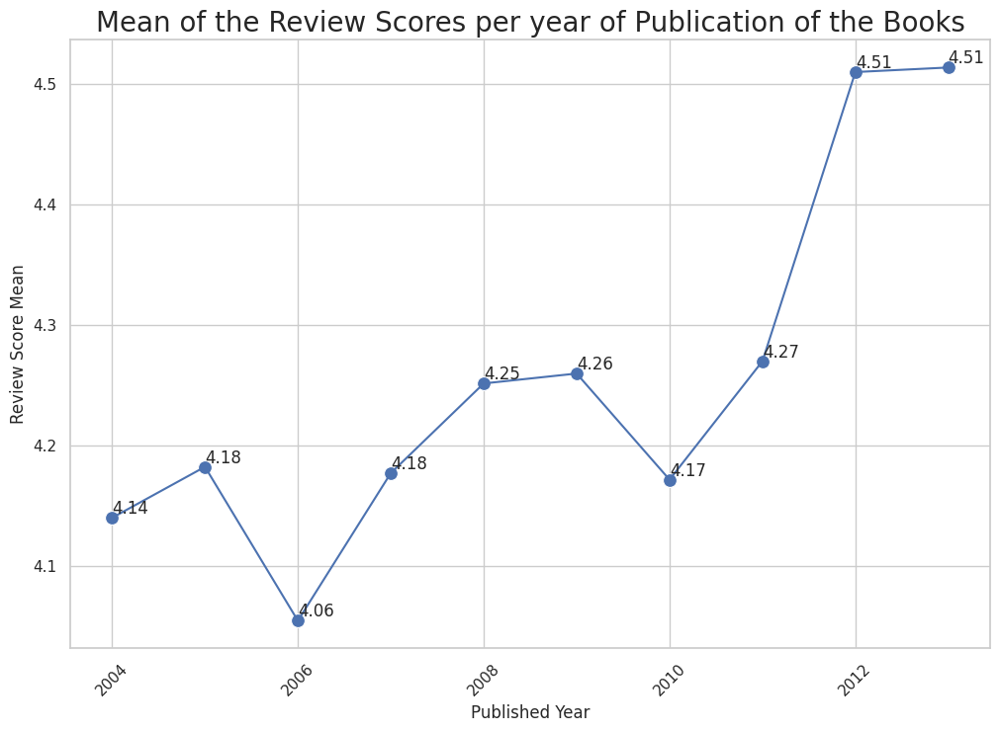

In [283]:
sns.set(style="whitegrid") 
plt.figure(figsize=(12, 8)) 

sns.lineplot(x=pub_year['published_year'], y=pub_year['mean'], linestyle='-')

sns.scatterplot(x=pub_year['published_year'], y=pub_year['mean'], color='b', s=100)

for i, row in pub_year.iterrows():
    plt.text(row['published_year'], row['mean'], f'{row["mean"]:.2f}', ha='left', va='bottom')

plt.xlabel('Published Year')
plt.ylabel('Review Score Mean')
plt.title('Mean of the Review Scores per year of Publication of the Books', fontsize=20)
plt.xticks(rotation=45)
plt.show()

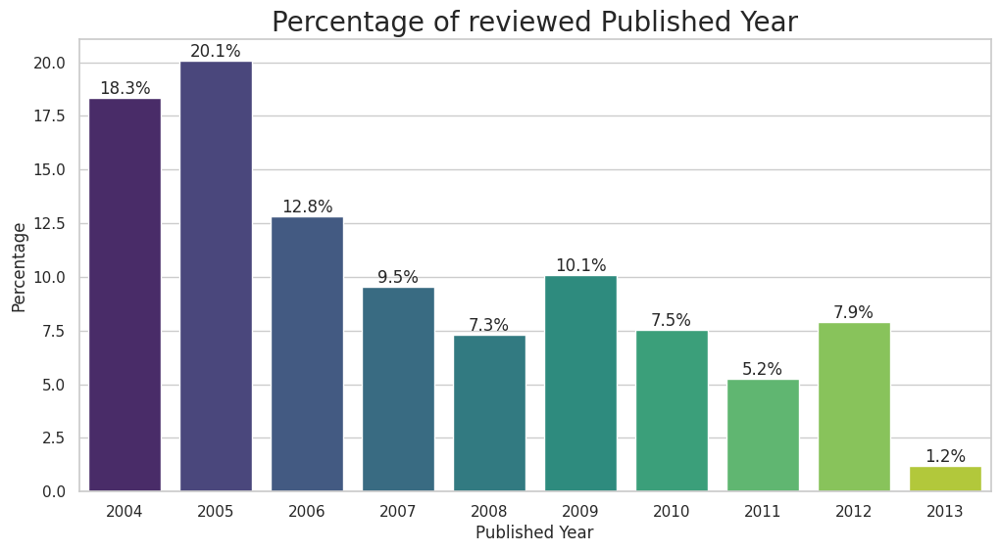

In [284]:
pub_year_percentage = (pub_year['count'] / pub_year['count'].sum()) * 100

sns.set(style="whitegrid") 
plt.figure(figsize=(12, 6))

ax = sns.barplot(x=pub_year['published_year'], y=pub_year_percentage, palette="viridis")

for bar, percentage in zip(ax.patches, pub_year_percentage):
    ax.annotate(f'{percentage:.1f}%', (bar.get_x() + bar.get_width() / 2, bar.get_height()), ha='center', va='bottom')

plt.xlabel('Published Year')
plt.ylabel('Percentage')
plt.title('Percentage of reviewed Published Year', fontsize=20)

plt.show()

Published Year Feature penalize books with less time of beign published when the review is done. For example, books published on 2013 would have more entries if the dataset. This is explained in the previous Barplot, where older books have the most quantity of reviews.

Published Year feature is not considered for the Model Training and Testing.

In [285]:
df_train = df_train.drop(['published_year'], axis=1)
X_train = X_train.drop(['published_year'], axis=1)

## Helpfulness

In [286]:
df_train.sample(5)

,fiction_category,top_publisher,review_year,helpfulness,text_clean,compound_sentiment,text_complexity,word_count,review
5027,1,0,2010,1.0,slowly working way hitchhiker guide galaxy series past school year science fiction genre typically like series seems written reader like focus hum...,0.9738,7.1,110,2.0
11390,0,0,2008,1.0,fabulous help caregiver eat part cycle great help lay everything easy understand manner tough time hard figure thing especially someone love much ...,0.9848,5.9,34,5.0
7735,0,0,2008,0.1,art beautiful idea accurate information interesting seem kind vague,0.8625,5.6,9,4.0
12360,1,1,2012,0.0,usual bernard cornwell give lesson history delicious character richard sharpe love series,0.8360,6.0,12,5.0
7367,1,0,2013,1.0,fantastic book read listen book would recommend anyone definitely classic,0.8316,4.7,10,5.0


In [287]:
df_train['helpfulness'].describe().T

count    12588.000000
mean         0.819897
std          0.315379
min          0.000000
25%          0.750000
50%          1.000000
75%          1.000000
max          1.000000
Name: helpfulness, dtype: float64

In [288]:
#Create a box plot to check for outliers, median and quartiles
fig = px.box(df_train, y='helpfulness')

fig.update_xaxes(title_text='')
fig.update_layout(
    title='Boxplot for Helpfulness Feature',
    title_x=0.5        
)

fig.show()

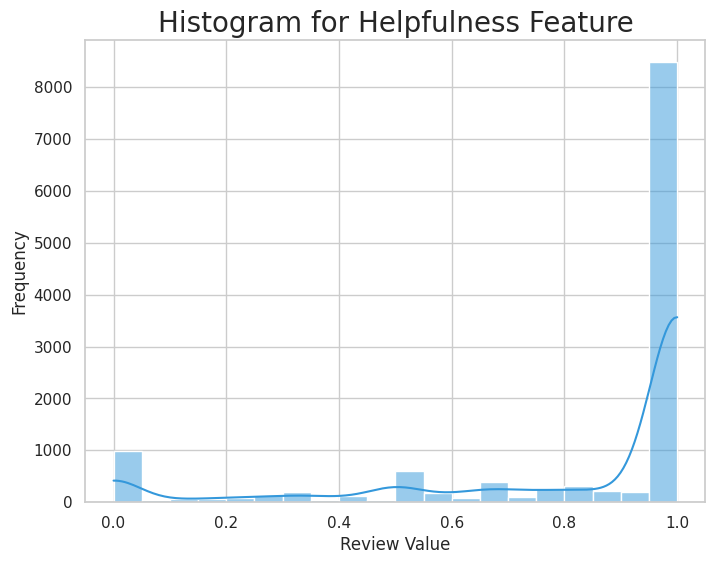

In [289]:
plt.figure(figsize=(8, 6))
sns.histplot(df_train['helpfulness'], bins=20, kde=True, color='#3498db')
plt.xlabel("Review Value")
plt.ylabel("Frequency")
plt.title("Histogram for Helpfulness Feature", fontsize=20)
plt.show()

In [290]:
#Correlation Analysis 
df_train[['helpfulness','review']].corr().style.background_gradient(cmap='Blues')

,helpfulness,review
helpfulness,1.000000,0.288342
review,0.288342,1.000000


In [291]:

# Create an interactive box plot using Plotly
fig = px.box(df_train, x='review', y='helpfulness')

fig.update_layout(
    title='Box Plot of Review vs Helpfulness',
    xaxis_title='Review',
    yaxis_title='Helpfulness',
    title_x=0.5
)

# Show the interactive plot
fig.show()

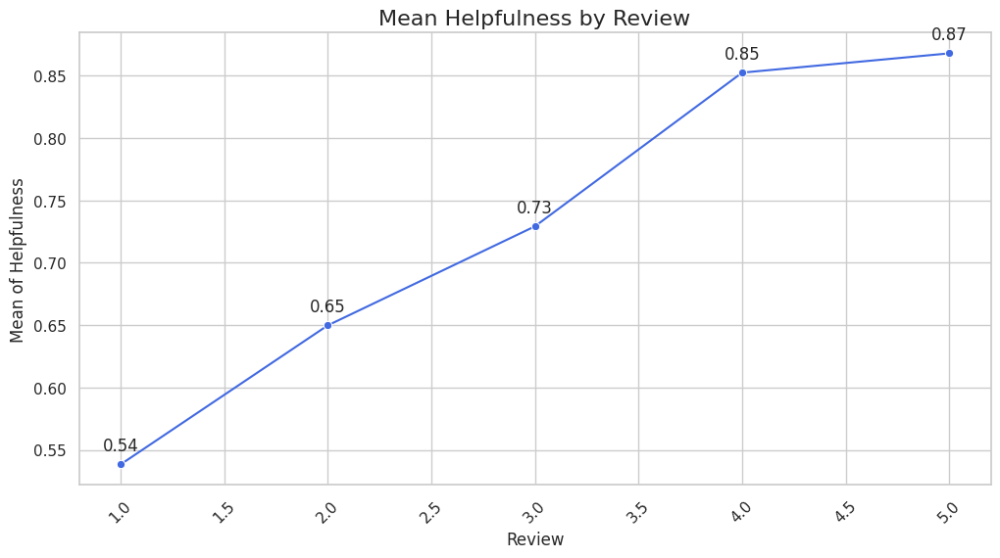

In [292]:
helpfulness_by_review = df_train.groupby('review')['helpfulness'].mean()

plt.figure(figsize=(12, 6))
sns.lineplot(x=helpfulness_by_review.index, y=helpfulness_by_review.values, marker='o', linestyle='-', color='royalblue')
plt.xlabel('Review')
plt.ylabel('Mean of Helpfulness')
plt.title('Mean Helpfulness by Review', fontsize=16)
plt.grid(True)

plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Add labels to each point
for x, y in zip(helpfulness_by_review.index, helpfulness_by_review.values):
    plt.annotate(f'{y:.2f}', (x, y), textcoords='offset points', xytext=(0,10), ha='center')

plt.show()

<Figure size 1200x600 with 0 Axes>

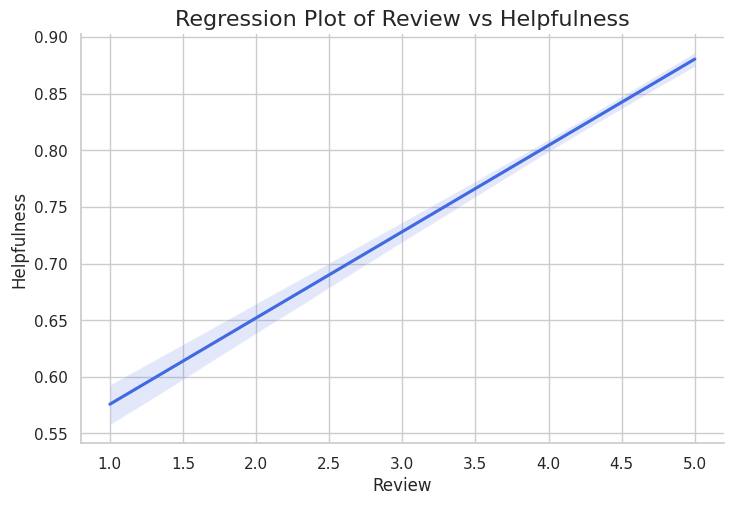

In [293]:
plt.figure(figsize=(12, 6))
sns.lmplot(x='review', y='helpfulness', data=df_train, height=5, aspect=1.5, scatter=False, line_kws={"color": "royalblue"})
plt.xlabel('Review')
plt.ylabel('Helpfulness')
plt.title('Regression Plot of Review vs Helpfulness', fontsize=16)
plt.grid(True)
plt.show()

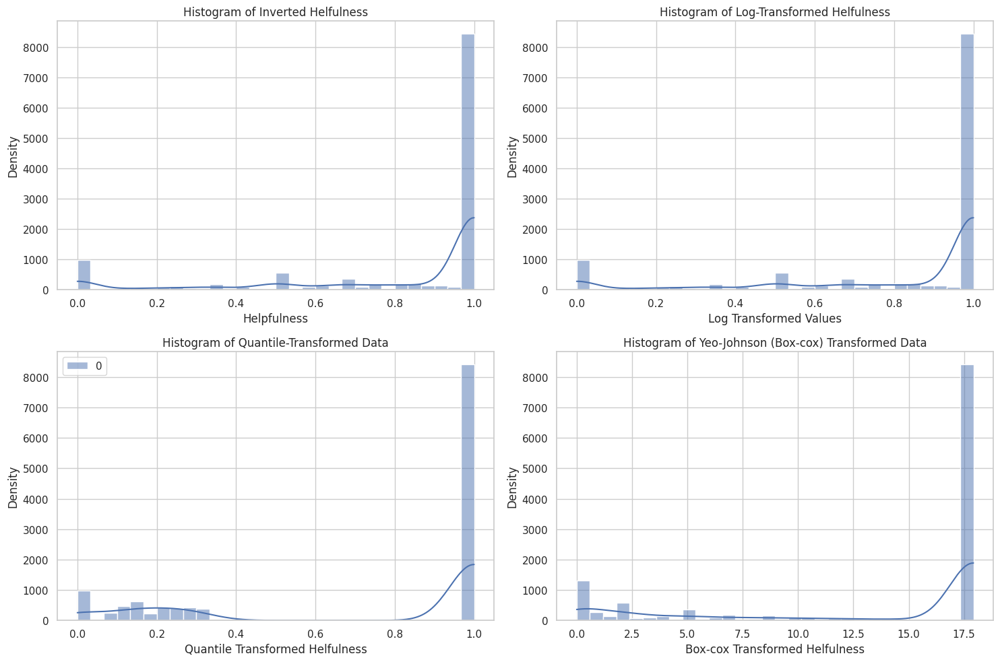

In [294]:
# Log transformation can help to reduce the bias towards to 1 
small_constant_log = 1e-10

helpfulness_data =  df_train['helpfulness']#1 - np.abs(df_train['helpfulness'])

helpfulness_log = helpfulness_data # np.log(helpfulness_data + small_constant_log) 

# Arcsin Transformation
small_constant_arcsin = 1e-5
helpfulness_arcsinh  = np.arcsinh(helpfulness_data)

#Box-Cox Transformation
helpfulness_box_cox, lambda_bestfit = stats.yeojohnson(helpfulness_data)

qt = QuantileTransformer(output_distribution='uniform')
helpfulness_quantile = qt.fit_transform(helpfulness_data.values.reshape(-1, 1))

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

sns.set(style="whitegrid")

sns.histplot(helpfulness_data, bins=30, kde=True, ax=axes[0,0])
axes[0,0].set_xlabel('Helpfulness')
axes[0,0].set_ylabel('Density')
axes[0,0].set_title('Histogram of Inverted Helfulness')

sns.histplot(helpfulness_log, bins=30, kde=True, ax=axes[0,1])
axes[0,1].set_xlabel('Log Transformed Values')
axes[0,1].set_ylabel('Density')
axes[0,1].set_title('Histogram of Log-Transformed Helfulness')

# Create a histogram plot for the arcsin-transformed data
sns.histplot(helpfulness_quantile, bins=30, kde=True, ax=axes[1,0])
axes[1,0].set_xlabel('Quantile Transformed Helfulness')
axes[1,0].set_ylabel('Density')
axes[1,0].set_title('Histogram of Quantile-Transformed Data')


# Create a histogram plot for the arcsin-transformed data
sns.histplot(helpfulness_box_cox, bins=30, kde=True, ax=axes[1,1])
axes[1,1].set_xlabel('Box-cox Transformed Helfulness')
axes[1,1].set_ylabel('Density')
axes[1,1].set_title('Histogram of Yeo-Johnson (Box-cox) Transformed Data')

plt.tight_layout()
plt.show()

NOTAS: Log y raiz y box cox son para variables con sesgo positivo. No funcionan en helfulness

Para esta variable debo invertirla, restarle 1. Y a esa función le aplico una transformación de ese tipo Log y raiz y box cox.

In [295]:
#Create a box plot to check for outliers, median and quartiles
fig = px.box(helpfulness_quantile)

fig.update_xaxes(title_text='')
fig.update_layout(
    title='Boxplot for Helpfulness Hiperbolic Acrsing Transformed Feature',
    title_x=0.5        
)

fig.show()

In [296]:

# Create an interactive box plot using Plotly
fig = px.box(x=df_train['review'], y=np.array(helpfulness_quantile).flatten())

fig.update_layout(
    title='Box Plot of Review vs Transformed Hyperbolic Arcsin Helpfulness',
    xaxis_title='Review',
    yaxis_title='Helpfulness',
    title_x=0.5
)

# Show the interactive plot
fig.show()

In [297]:
df_train['helpfulness_quantile'] = helpfulness_quantile

df_train[['helpfulness_quantile', 'helpfulness', 'review']].corr().style.background_gradient(cmap='Blues')

,helpfulness_quantile,helpfulness,review
helpfulness_quantile,1.000000,0.890608,0.318529
helpfulness,0.890608,1.000000,0.288342
review,0.318529,0.288342,1.000000


In [298]:
#qt
df_train['helpfulness'] = df_train['helpfulness_quantile'] 
df_train = df_train.drop(['helpfulness_quantile'], axis=1)

In [299]:
X_test['helpfulness'] = qt.transform(X_test['helpfulness'].values.reshape(-1, 1))

### Key Findings for helpfulness

- Reviews with a high review score are found more helpfull than reviews with low review score.
- Mean of the helpfulness and review have a linear relationship.
- Helpfulness vs review regression plot confirms the linear relation between the variables.

## Review_Year

In [300]:
rev_year = df_train[['review_year','review']]
rev_year.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12588 entries, 3268 to 2317
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   review_year  12588 non-null  int64  
 1   review       12588 non-null  float64
dtypes: float64(1), int64(1)
memory usage: 295.0 KB


In [301]:
rev_year = rev_year.groupby('review_year')['review'].agg(['mean', 'count']).reset_index()

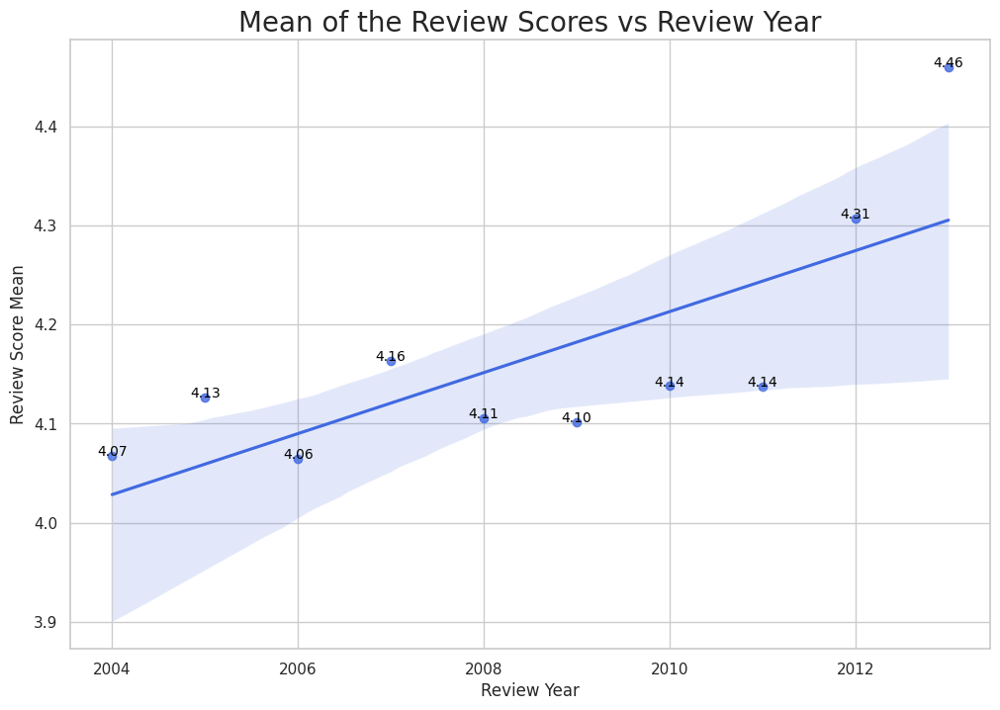

In [302]:
plt.figure(figsize=(12, 8))
ax = sns.regplot(data=rev_year, x='review_year', y='mean', color='royalblue')
plt.xlabel('Review Year')
plt.ylabel('Review Score Mean')
plt.title('Mean of the Review Scores vs Review Year', fontsize=20)
plt.grid(True)

# Add labels to the points
for line in range(0, rev_year.shape[0]):
    ax.text(rev_year['review_year'][line], rev_year['mean'][line], f'{rev_year["mean"][line]:.2f}', horizontalalignment='center', fontsize=10, color='black')

plt.show()

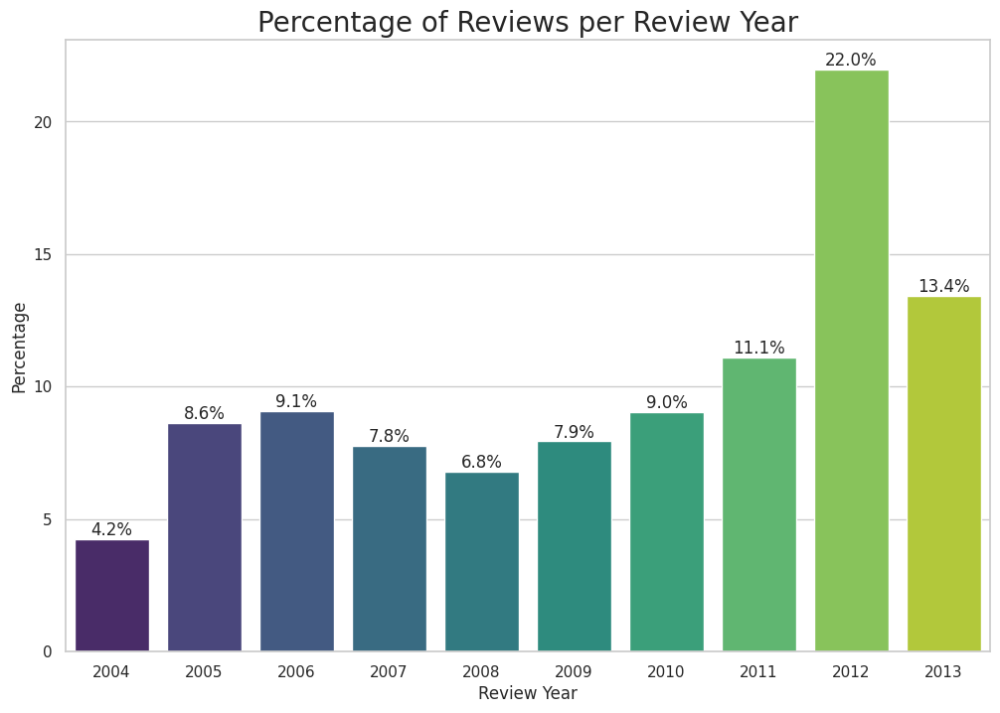

In [303]:
rev_year_percentage = (rev_year['count'] / rev_year['count'].sum()) * 100

sns.set(style="whitegrid")  # Establecer el estilo de la cuadrícula
plt.figure(figsize=(12, 8))  # Establecer el tamaño de la figura

# Crear el gráfico de barras con Seaborn
ax = sns.barplot(x=rev_year['review_year'], y=rev_year_percentage, palette="viridis")

# Agregar etiquetas de porcentaje en las barras
for bar, percentage in zip(ax.patches, rev_year_percentage):
    ax.annotate(f'{percentage:.1f}%', (bar.get_x() + bar.get_width() / 2, bar.get_height()), ha='center', va='bottom')

# Personalizar etiquetas y título
plt.xlabel('Review Year')
plt.ylabel('Percentage')
plt.title('Percentage of Reviews per Review Year', fontsize=20)

# Mostrar el gráfico
plt.show()

### Removing Review Year

This column is removed as the goal of the model is to be used to predict newer entries in the future. Tools and Technologies changes with the time. Review scores are often more dependent on the content of the review, including sentiments expressed, specific aspects of the book discussed, and the writing style. The Scope of the current hypotesis search to predict the review score based on the on the content of the review itself, not the time at which the review was written.

In [304]:
df_train = df_train.drop(['review_year'], axis=1)
X_test = X_test.drop(['review_year'], axis=1)

## Publisher

In [305]:
df_train.sample(2)

,fiction_category,top_publisher,helpfulness,text_clean,compound_sentiment,text_complexity,word_count,review
14811,1,1,0.0,tracy chevalier idea quot girl pearl earring quot taking famous painting imagining story behind creation series woven tapestry hang today museum p...,0.8316,11.9,59,4.0
4607,0,0,0.0,people aspire real expert sql server read book cover cover skipping pompous essay back quote beginning chapter lot help remind coding sql,0.4019,9.9,22,4.0


In [306]:
df_train['top_publisher'].value_counts()

top_publisher
0    8820
1    3768
Name: count, dtype: int64

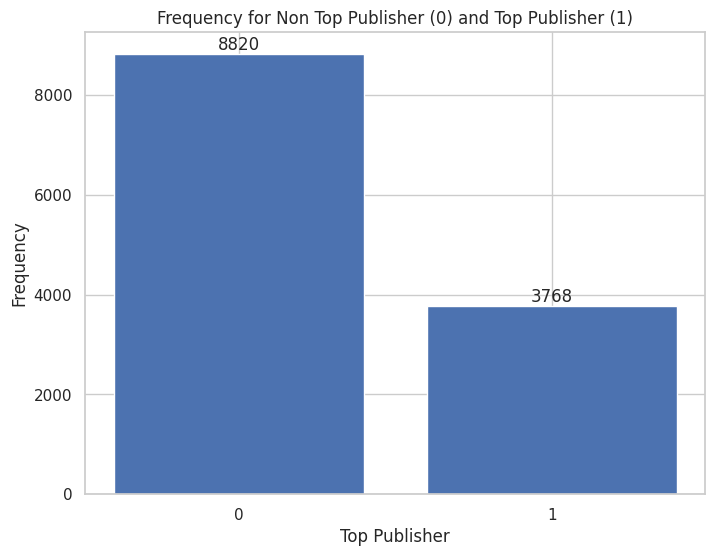

In [307]:
fig, ax = plt.subplots(figsize=(8, 6))
plt.grid(True)
binary_labels = [format(val, 'b') for val in df_train['top_publisher'].value_counts(ascending=False).keys()]
bars = ax.bar(df_train['top_publisher'].unique(), height=df_train['top_publisher'].value_counts(ascending=False))
plt.xticks(df_train['top_publisher'].unique(), binary_labels)
ax.set_title('Frequency for Non Top Publisher (0) and Top Publisher (1)')
ax.set_xlabel('Top Publisher')
ax.set_ylabel('Frequency')
ax.bar_label(bars)
plt.show()

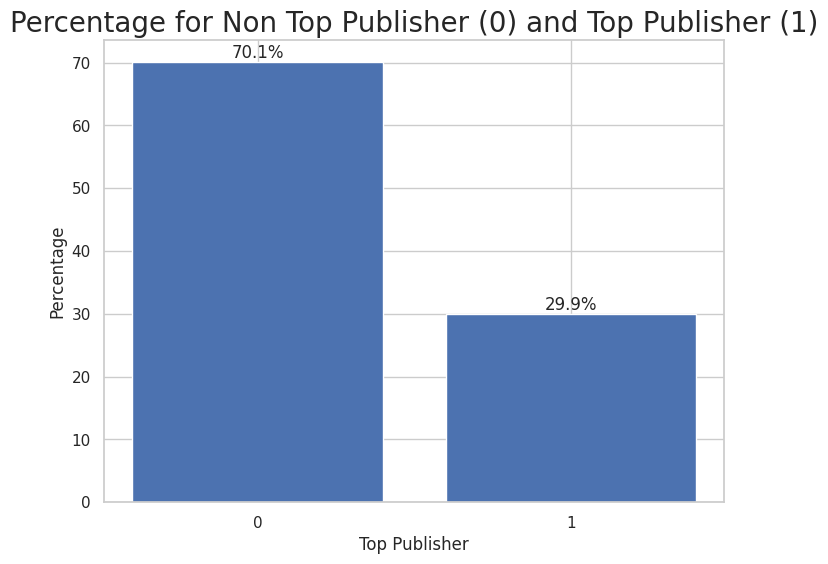

In [308]:
#Show a barplot by Percentages
category_percetage = df_train['top_publisher'].value_counts(ascending=False)/df_train['top_publisher'].value_counts(ascending=False).sum()*100

fig, ax = plt.subplots(figsize=(8, 6))
bars = ax.bar(df_train['top_publisher'].value_counts(ascending=False).keys(), category_percetage)

# Set the bar labels (percentages) to be displayed above the bars
ax.bar_label(bars, fmt='%.1f%%')

plt.xticks(df_train['top_publisher'].value_counts(ascending=False).keys(), binary_labels)
plt.xlabel('Top Publisher')
plt.ylabel('Percentage')
plt.title('Percentage for Non Top Publisher (0) and Top Publisher (1)', fontsize = 20)
plt.show()


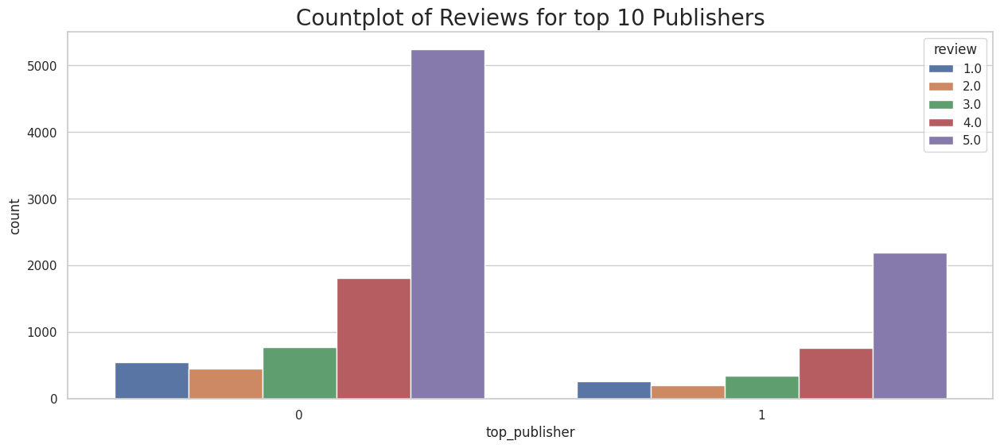

In [309]:
plt.figure(figsize=(15, 6))
sns.countplot(data=df_train, x = 'top_publisher', hue='review')
plt.title('Countplot of Reviews for top 10 Publishers', fontsize = 20)
plt.show()

In [310]:
fig = px.box(df_train, x='top_publisher', y='review')
fig.update_xaxes(categoryorder='total descending')
fig.update_layout(
    title='Interactive Box Plot of Review by Publisher',
    xaxis_title='Publisher',
    yaxis_title='Review'
)
fig.show()

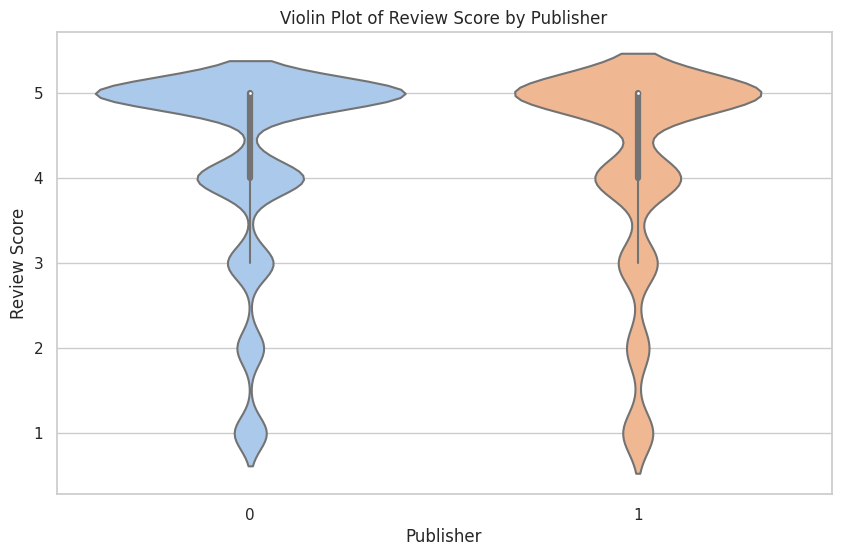

In [311]:

plt.figure(figsize=(10, 6))
sns.violinplot(x='top_publisher', y='review', data=df_train, palette='pastel')
plt.xlabel('Publisher')
plt.ylabel('Review Score')
plt.title('Violin Plot of Review Score by Publisher')
plt.show()


### Key Findings for Publisher

- Non-Top and Top Publishers have a Review Score biased to high values. Both of them have the 25% percentile above 4. Having the median value and 75% percentile on 5. 
- Non-Top and Top Publishers have values on the 5 possible review scores. As it contains valid variability, this feature is kept.

## Compound Sentiment

This variable is the result of applying vader lexicon with NLTK library to the cleaned text review from the Dataset.

In [312]:
df_train.sample(2)

,fiction_category,top_publisher,helpfulness,text_clean,compound_sentiment,text_complexity,word_count,review
10661,0,0,1.000000,clavin hobbes fan must collection itsvery good,0.6369,3.2,7,5.0
14826,0,0,0.162162,needed text astronomy class wanting save money bought amazon market place treated beautiful colorful book timely delivery,0.8316,6.1,17,5.0


In [313]:
df_train['compound_sentiment'].describe().T

count    12588.000000
mean         0.627461
std          0.512862
min         -0.998500
25%          0.557400
50%          0.856350
75%          0.951700
max          0.999800
Name: compound_sentiment, dtype: float64

compound_sentiment range goes from -1 to 1. As more near is the value to 1, more positive is the sentiment extracted from the text. And as more near to -1 is the value,
more negative is the sentiment predicted from the value.

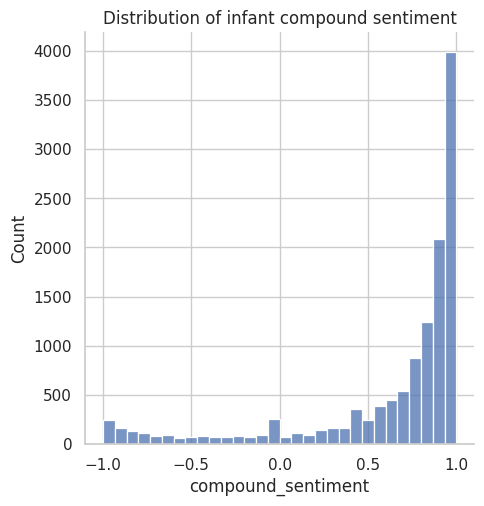

In [314]:
sns.displot(df_train['compound_sentiment'], bins=30)

plt.title('Distribution of infant compound sentiment')

plt.show()

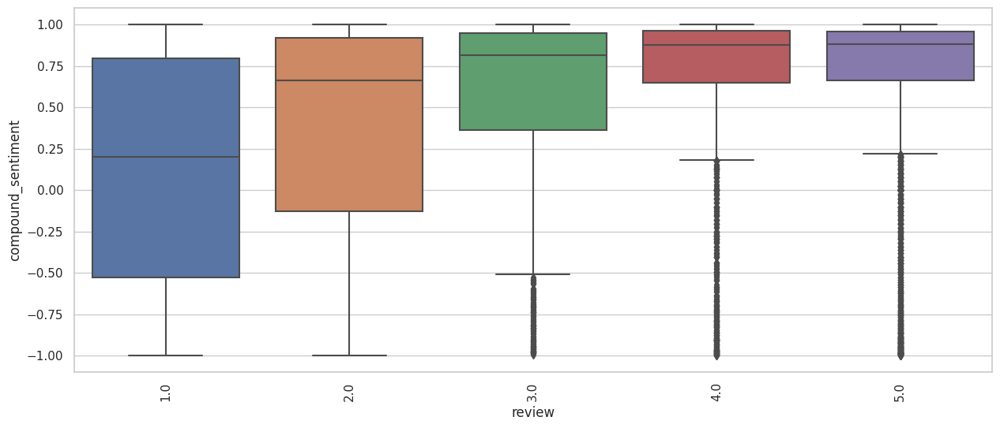

In [315]:
plt.figure(figsize=(15, 6)) 
sns.boxplot(x='review', y='compound_sentiment', data=df_train)
plt.xticks(rotation=90)
plt.show()

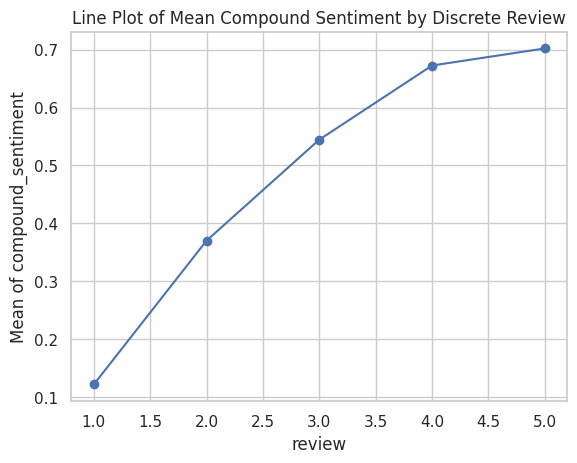

In [316]:
mean_by_review = df_train.groupby('review')['compound_sentiment'].mean()
mean_by_review.plot(kind='line', marker='o', linestyle='-')
plt.xlabel('review')
plt.ylabel('Mean of compound_sentiment')
plt.title('Line Plot of Mean Compound Sentiment by Discrete Review')
plt.grid(True)
plt.show()

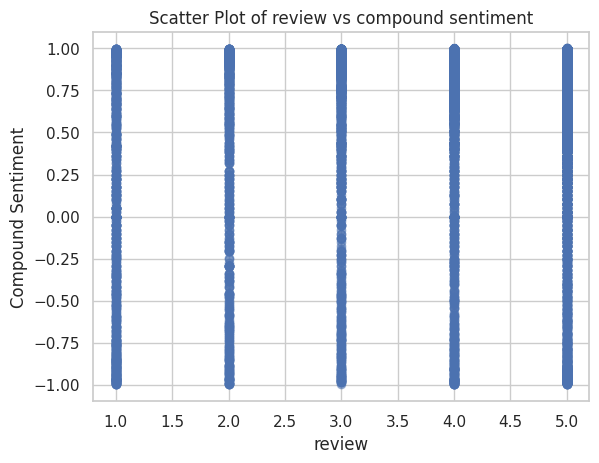

In [317]:
plt.scatter(df_train['review'], df_train['compound_sentiment'], alpha=0.5)
plt.xlabel('review')
plt.ylabel('Compound Sentiment')
plt.title('Scatter Plot of review vs compound sentiment')
plt.show()

In [318]:
df_train[['compound_sentiment', 'review']].corr().style.background_gradient(cmap='Blues')

,compound_sentiment,review
compound_sentiment,1.000000,0.287288
review,0.287288,1.000000


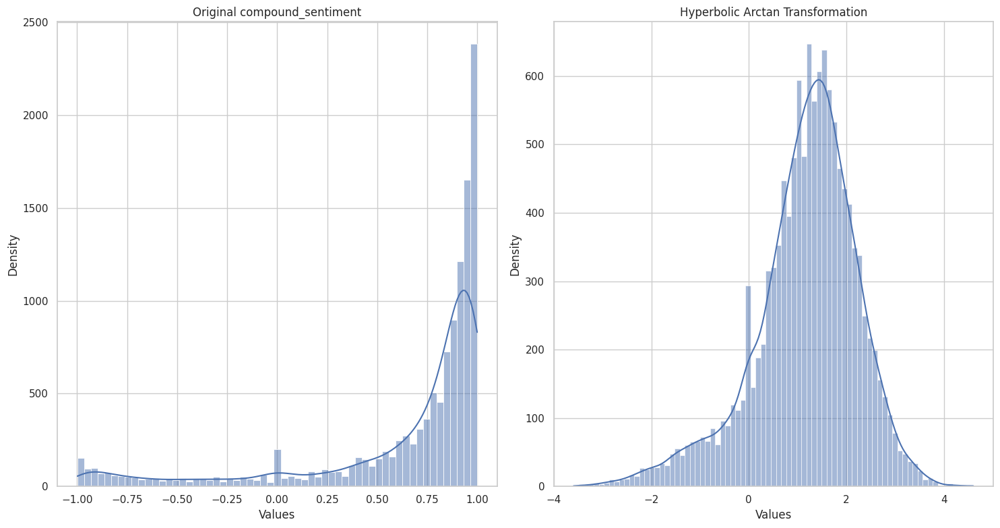

In [319]:
# Apply transformation
fig, axes = plt.subplots(1, 2, figsize=(15, 8))
data = df_train['compound_sentiment']

sns.set(style="whitegrid")

sns.histplot(data, kde=True, ax=axes[0])
axes[0].set_title('Original compound_sentiment')
axes[0].set_ylabel('Density')
axes[0].set_xlabel('Values')

compound_sentiment_arctanh_transformed = np.arctanh(df_train['compound_sentiment'])
sns.histplot(compound_sentiment_arctanh_transformed, kde=True, ax=axes[1])
axes[1].set_title('Hyperbolic Arctan Transformation')
axes[1].set_xlabel('Values')
axes[1].set_ylabel('Density')

#boxcox failed for negative values

plt.tight_layout()
plt.show()

Box Cox Transformation is not tested as it fails with negative values.

The arctanh transformation is given by:

$y = \tanh^{-1}(x) = \frac{1}{2} \ln\left(\frac{1 + x}{1 - x}\right)$

Here, x is the original data point, and y is the transformed data point.

Inverse hyperbolic tangent (arctanh) transformation is good an option for making a dataset column with values in the range of -1 to 1 more normally distributed.

In [320]:
# Create an interactive box plot using Plotly
fig = px.box(x=df_train['review'], y=compound_sentiment_arctanh_transformed)

fig.update_layout(
    title='Box Plot of Review vs Transformed Hyperbolic Arctan Compound Sentiment',
    xaxis_title='Review',
    yaxis_title='Compound Sentiment',
    title_x=0.5
)

# Show the interactive plot
fig.show()

In [321]:
df_train['compound_sentiment'] = compound_sentiment_arctanh_transformed
df_train.sample(5)

,fiction_category,top_publisher,helpfulness,text_clean,compound_sentiment,text_complexity,word_count,review
848,0,0,1.000000,first considering buying book thought would spiritual depth reading able get relationship back god book combine lot faith wisdom lot prophetic wor...,1.856991,7.9,36,5.0
2873,0,0,0.162162,awesome atlas great teaching atlas explanation along picture great way system teacher guiding structure organ also incus rom installed computer re...,1.609594,9.8,29,4.0
6537,1,0,0.312813,warned paperback edition purple black moonlit dragon cover illustrated despite amazon description since enchanting illustration major reason loved...,0.785408,9.5,50,2.0
5156,1,1,1.000000,found interesting book written set six century future limited imagination huxley regard modern gadgetry start student still writing pencil paper e...,-0.103063,7.5,29,4.0
14454,0,0,1.000000,love charles spurgeon start start morning evening much written spurgeon think gain insight heart man deep love devotion jesus find many devotional...,2.287558,3.3,46,5.0


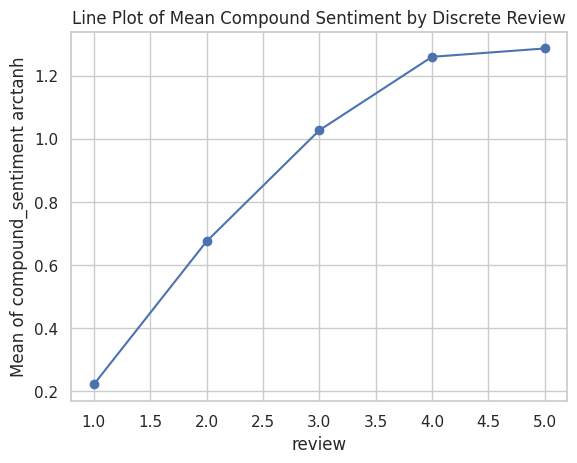

In [322]:
mean_by_review = df_train.groupby('review')['compound_sentiment'].mean()
mean_by_review.plot(kind='line', marker='o', linestyle='-')
plt.xlabel('review')
plt.ylabel('Mean of compound_sentiment arctanh')
plt.title('Line Plot of Mean Compound Sentiment by Discrete Review')
plt.grid(True)
plt.show()

In [323]:
X_test['compound_sentiment'] = np.arctanh(X_test['compound_sentiment'])

### Key Findings for Compound Sentiment

- From the Distribution Plot, it is visible that Compound Sentiment Feature is biased to high levels/positive levels.
- The Boxplot figure shows the relation between review and compound sentiment. For High score reviews, the Compound sentiments tends to increase and be positive. And for Low Review Scores, the sentiment tends to be negative. This can explain the first bullet, because the dataset contains more entries with High Score Values, the positive Compound sentiment will increse.
- The line plot confirms the relationship between review and compound sentiment, plotting the mean of the compound sentiment for each review score. There is a positive relation. When review tends to be high, compound sentiment tends to be 1. 

## Text Complexity

 Flesch-Kincaid Grade Level readability score was used to estimate the readability and complexity of the text based on factors like sentence length and word difficulty

In [324]:
df_train.sample(3)

,fiction_category,top_publisher,helpfulness,text_clean,compound_sentiment,text_complexity,word_count,review
12480,0,0,0.272773,appears collapse soviet union lot previously secret information released also seems last western publisher able connect russian writer actually ge...,0.280319,10.7,92,5.0
13634,1,0,1.000000,tony valentine novel james swain creates character develop strong liking knowledge card gaming industry put character extreme situation fun intere...,2.484655,7.5,72,5.0
5722,0,0,0.321321,already outstanding series thrilled navarre publishing new testament hardback however wish editor would done including new vulgate well rsv outsta...,2.113011,7.0,86,5.0


In [325]:
df_train['text_complexity'].describe().T

count    12588.000000
mean         7.276676
std          3.233083
min         -3.100000
25%          5.000000
50%          7.000000
75%          9.200000
max         34.800000
Name: text_complexity, dtype: float64

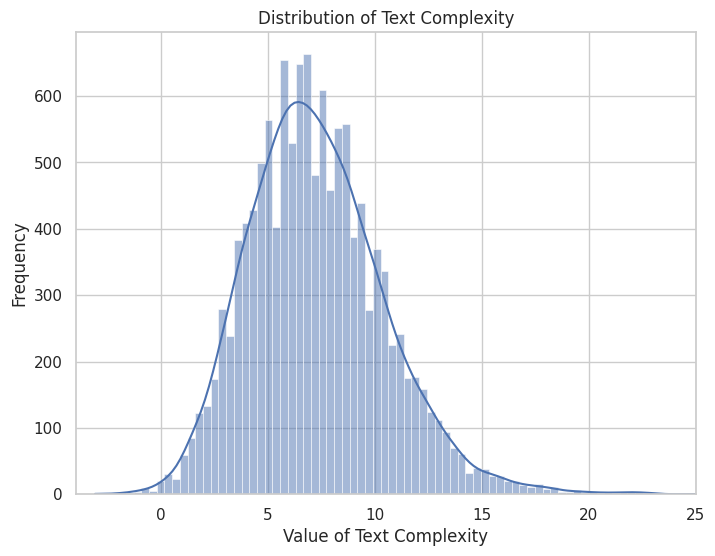

In [326]:
# Plot a histogram to visualize the distribution of the continuous variable
plt.figure(figsize=(8, 6))
sns.histplot(data=df_train, x='text_complexity', kde=True)
plt.title("Distribution of Text Complexity")
plt.xlabel("Value of Text Complexity")
plt.xlim(-4, 25)
plt.ylabel("Frequency")
plt.show()


In [327]:
#Create a box plot to check for outliers, median and quartiles
fig = px.box(df_train, y='text_complexity')

fig.update_xaxes(title_text='')
fig.update_layout(
    title='Boxplot for Text Complexity Feature',
    title_x=0.5        
)

fig.show()

In [328]:

# Create an interactive box plot using Plotly
fig = px.box(df_train, x='review', y='text_complexity')

fig.update_layout(
    title='Box Plot of Review vs Text Complexity',
    xaxis_title='Review',
    yaxis_title='Text Complexity',
    title_x=0.5
)

# Show the interactive plot
fig.show()

<Figure size 1200x600 with 0 Axes>

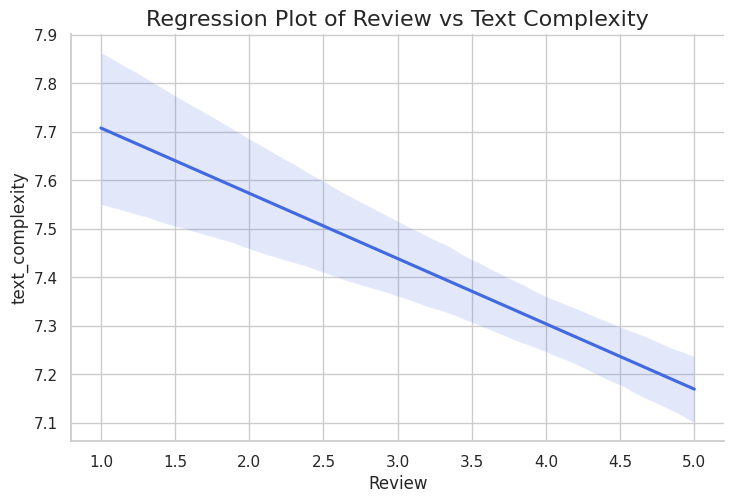

In [329]:
plt.figure(figsize=(12, 6))
sns.lmplot(x='review', y='text_complexity', data=df_train, height=5, aspect=1.5, scatter=False, line_kws={"color": "royalblue"})
plt.xlabel('Review')
plt.ylabel('text_complexity')
plt.title('Regression Plot of Review vs Text Complexity', fontsize=16)
plt.grid(True)
plt.show()

## Word Count

In [330]:
df_train['word_count'].describe().T

count    12588.000000
mean        67.572927
std         87.446267
min          1.000000
25%         18.000000
50%         37.000000
75%         81.000000
max       1460.000000
Name: word_count, dtype: float64

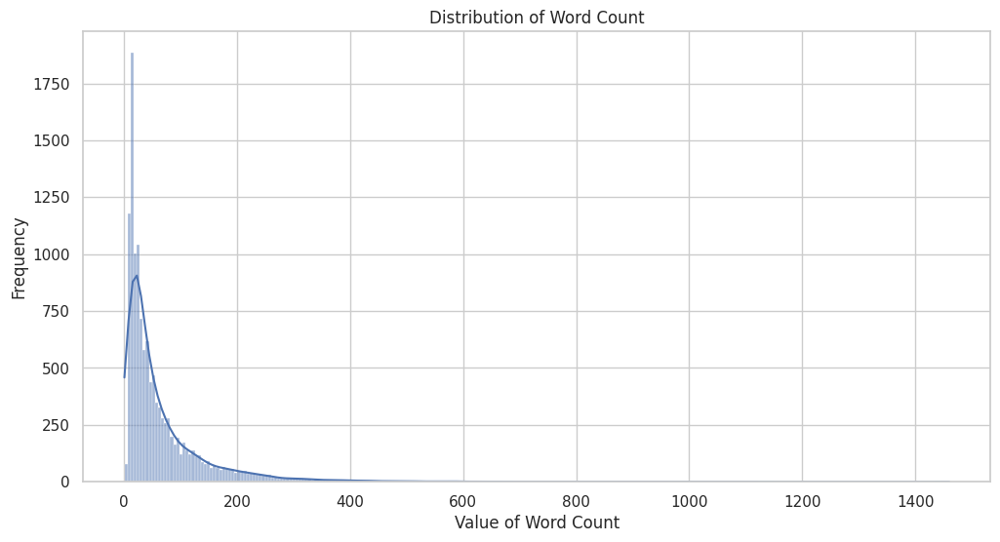

In [331]:
# Plot a histogram to visualize the distribution of the continuous variable
plt.figure(figsize=(12, 6))
sns.histplot(data=df_train, x='word_count', kde=True)
plt.title("Distribution of Word Count")
plt.xlabel("Value of Word Count")
plt.ylabel("Frequency")
plt.show()

In [332]:
df_train[df_train['word_count']>500]['word_count'].value_counts().sum()

70

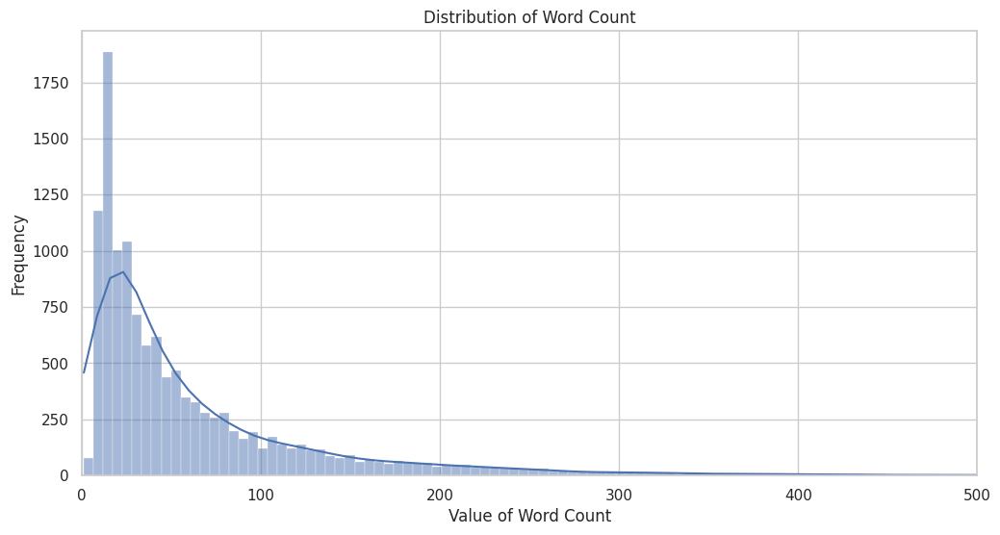

In [333]:
# Plot a histogram to visualize the distribution of the continuous variable
plt.figure(figsize=(12, 6))
sns.histplot(data=df_train, x='word_count', kde=True)
plt.title("Distribution of Word Count")
plt.xlabel("Value of Word Count")
plt.xlim((0, 500))
plt.ylabel("Frequency")
plt.show()

In [334]:

# Create an interactive box plot using Plotly
fig = px.box(df_train, x='review', y='word_count')

fig.update_layout(
    title='Box Plot of Review vs Word Count',
    xaxis_title='Review',
    yaxis_title='Word Count',
    title_x=0.5
)

# Show the interactive plot
fig.show()

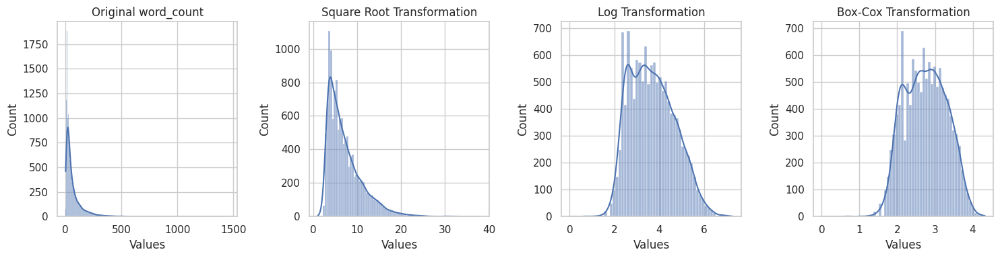

In [335]:
# Create a figure with subplots
fig, axes = plt.subplots(1, 4, figsize=(15, 4))
data = df_train['word_count']
# Original data
sns.histplot(data, kde=True, ax=axes[0])
axes[0].set_title('Original word_count')
axes[0].set_xlabel('Values')

# Square root transformation
sqrt_transformed = np.sqrt(data)
sns.histplot(sqrt_transformed, kde=True, ax=axes[1])
axes[1].set_title('Square Root Transformation')
axes[1].set_xlabel('Values')

# Log transformation
log_transformed = np.log(data)
sns.histplot(log_transformed, kde=True, ax=axes[2])
axes[2].set_title('Log Transformation')
axes[2].set_xlabel('Values')

# Box-Cox transformation
boxcox_transformed, best_lambda = stats.boxcox(data)
sns.histplot(boxcox_transformed, kde=True, ax=axes[3])
axes[3].set_title('Box-Cox Transformation')
axes[3].set_xlabel('Values')

plt.tight_layout()
plt.show()


In [336]:
best_lambda

-0.15804217863750494

The Box-Cox transformation formula is as follows:

$ y = \begin{cases}
    \frac{{x^\lambda - 1}}{\lambda}, & \text{if } x > 0 \\
    \ln(x), & \text{if } x = 0
\end{cases} $

In this formula, \(x\) represents the original data, and \(y\) represents the transformed data. The parameter \(\lambda\) is estimated to make the data as close to a normal distribution as possible.

Log Transformation is simply a case on of the Box-Cox where $\lambda$ is set to 0. As the best lambda calculated is not 0, and Box Cox and Log Transformations give the best results. Box Cox is kept.

In [337]:
df_train['word_count'] = boxcox_transformed
df_train.sample(10)

,fiction_category,top_publisher,helpfulness,text_clean,compound_sentiment,text_complexity,word_count,review
5326,0,1,1.000000,since recently read kitchen confidential tender bone thought continue food related memoir theme say book life kitchen life family albeit atypical ...,1.391042,7.6,2.719985,4.0
295,0,0,0.222723,comforted journal meditation year continue take refuge word lie bedside spark bible reading prayer anything entry always seemed address tenderness...,1.163262,8.2,2.522961,5.0
346,0,0,0.255255,start good wisdom turn alot dribble book part outstanding clarity consciousness book part introduce new way thinking also book lot nonsense someti...,2.197022,7.5,3.308445,4.0
3041,1,0,1.000000,finished novel wanted add two cent hundred review interesting well written novel one favorite author spoil anything expect vonnegut wry dark wit e...,1.880089,8.1,2.795317,5.0
1004,0,1,1.000000,impression smaller book however great book set coffee table,0.904331,4.4,1.856304,4.0
13985,1,1,1.000000,absolutely wonderful great read definitely help explain come lotr book,1.655437,9.9,1.930138,5.0
13405,0,0,1.000000,everything promised book point may little simple experienced programmer beginner great resource example laid fun informative manner glad bought,1.569210,4.4,2.354320,5.0
8992,0,1,0.184521,getting sick tired large corporation making ton money lying people truth chris paolini published yet publisher trying make whole lot money keeping...,-1.191359,5.7,2.835458,1.0
5391,1,1,1.000000,one favorite tale great classic tale read multiple time enjoy every time kindle version worked well ipad,1.516581,3.3,2.283862,5.0
6421,1,1,1.000000,one story know gist know came like associate old bug bunny episode fact capture essential detail story worth reading reading read deeper follow de...,0.051646,6.0,2.736010,4.0


In [338]:
X_test['word_count'] = stats.boxcox(X_test['word_count'], best_lambda)

In [339]:

# Create an interactive box plot using Plotly
fig = px.box(df_train, x='review', y='word_count')

fig.update_layout(
    title='Box Plot of Review vs Word Count',
    xaxis_title='Review',
    yaxis_title='Word Count',
    title_x=0.5
)

# Show the interactive plot
fig.show()

## EDA for Review Text Column

In [340]:
pd.set_option('display.max_colwidth', 150)

Original median of Word Count for the most frequent words in the dataset is under 100 words. So 100 words is used as the max_words parameter of the wordclouds.

Word Cloud of most repeated 100 words on reviews with a review Score = 5. 

In [341]:
df_train[df_train['review']==5]['text_clean'].sample(5, random_state=1299)

12246    wonderful unforgettable near perfect reading rereading year simply love book overt ideology mar tortilla curtain enough research novel beautifully...
10256    girl went away required reading family member girl went away surrendered baby could hardly put book opened eye sister went year old story story go...
5271     struggling ready give game five day week hawaii playing golf golf membersi frustrated nothing went right rediscovered book came realization mixing...
2125     excellent book start concise review davinci code unfamiliar move critical examination major point book make doe get bogged picking every inaccurac...
1768     daughter big fan play birthday gave ticket friend play program sold disappointed started researching amazon see found book read review book encomp...
Name: text_clean, dtype: object

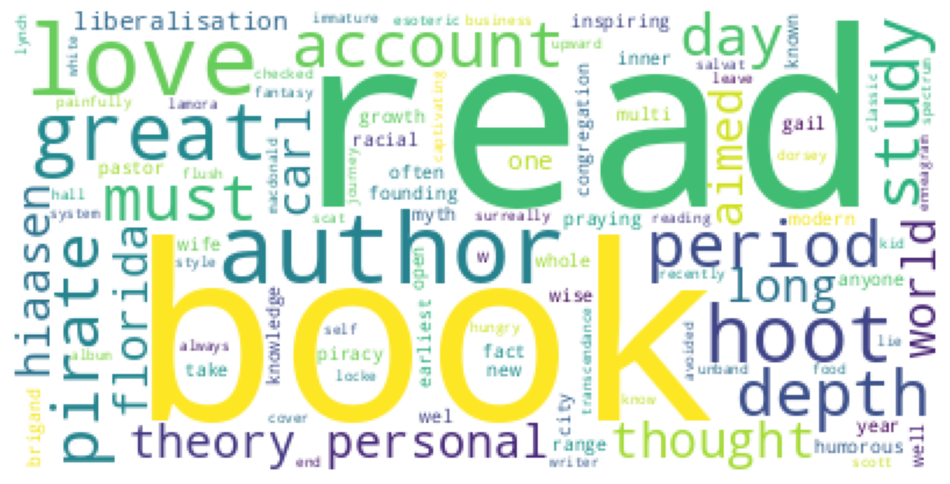

In [342]:
wordcloud5 = WordCloud(max_words=100,  background_color='White',  collocations=False, random_state=1925).generate(str(df_train[df_train['review']==5]['text_clean']))

fig = plt.figure(figsize=(12,12))

plt.axis('off')

plt.imshow(wordcloud5)

plt.show()

More Used words on Reviews with a review Score of 5 includes:book, love, enjoyed, child, read, good, agree, writing, movie. 

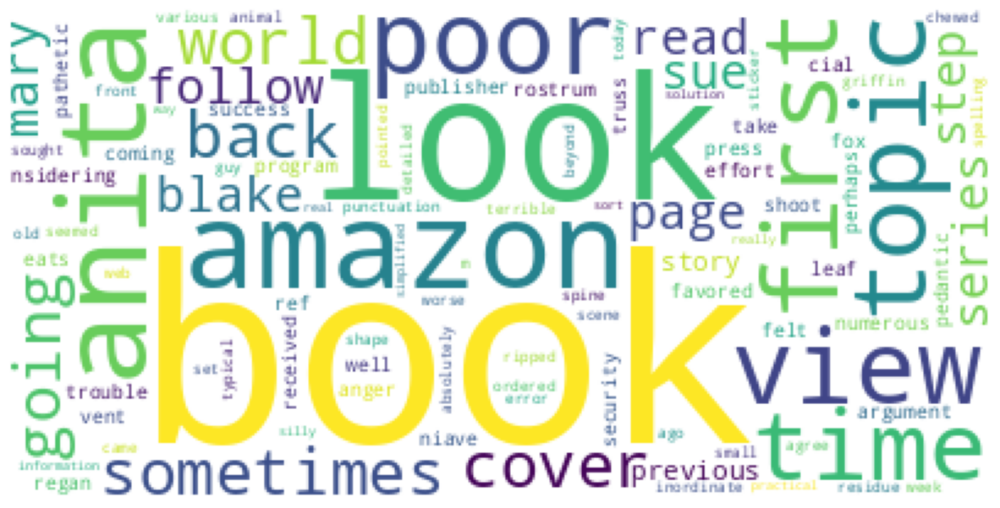

In [343]:
wordcloud1 = WordCloud(max_words=100,  background_color='White', random_state=1925).generate(str(df_train[df_train['review']==1]['text_clean']))

fig = plt.figure(figsize=(15,12))

plt.axis('off')

plt.imshow(wordcloud1)

plt.show()

More Used words on Reviews with a review Score of 1 includes:series, book, look, bad, random, enjoyed, blake, amazon, poorly, surprised.

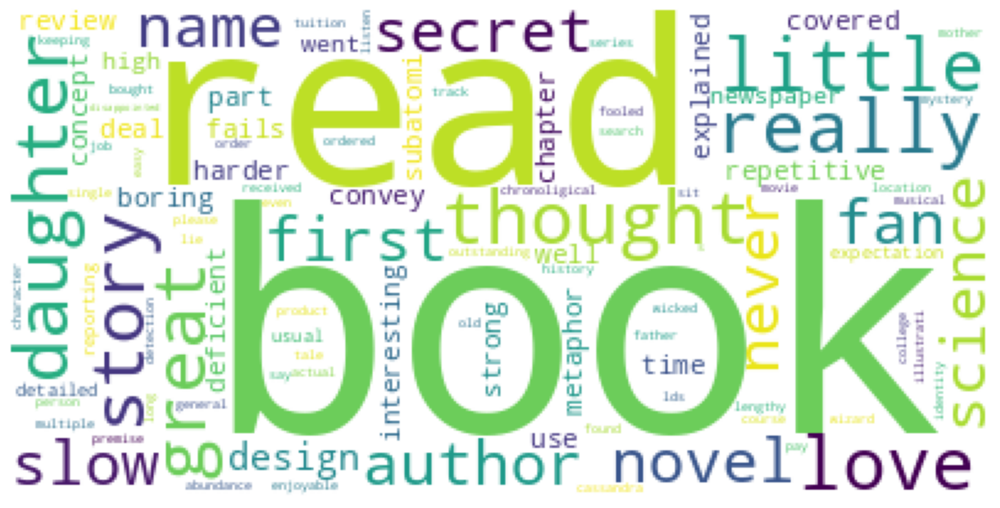

In [344]:
neutral_reviews = df_train[df_train['review'] == 3].copy() # Neutral ratings tend to be larger in words count

neutral_reviews['text_clean'].str.len().mean()

wordcloud3 = WordCloud(max_words=100,  background_color='White', random_state=5).generate(str(neutral_reviews['text_clean']))

fig = plt.figure(figsize=(15,12))

plt.axis('off')

plt.imshow(wordcloud3)

plt.show()

More Used words on Reviews with a review Score of 1 includes:little, story, love, fan, well, boring, slow, never, interesting, deficient.

Wordcloud by Category

In [345]:
df_train.sample(1)

,fiction_category,top_publisher,helpfulness,text_clean,compound_sentiment,text_complexity,word_count,review
14244,0,0,0.0,book time actually maybe day said would perfect condition see flaw book,0.650342,4.8,2.055035,5.0


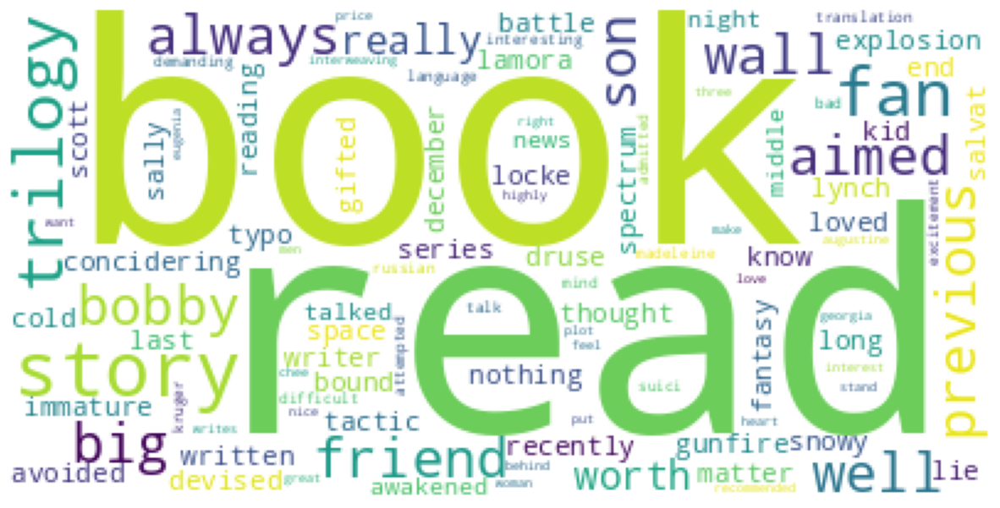

In [346]:
fiction_review = df_train[df_train['fiction_category'] == 1].copy() 

wordcloudfiction = WordCloud(max_words=100,  background_color='White', random_state=5).generate(str(fiction_review['text_clean']))

fig = plt.figure(figsize=(15,12))

plt.axis('off')

plt.imshow(wordcloudfiction)

plt.show()

More Used words on Reviews for fiction includes:fantasy, lie, battle, trilogy, tactic, spectrum, fan, kif

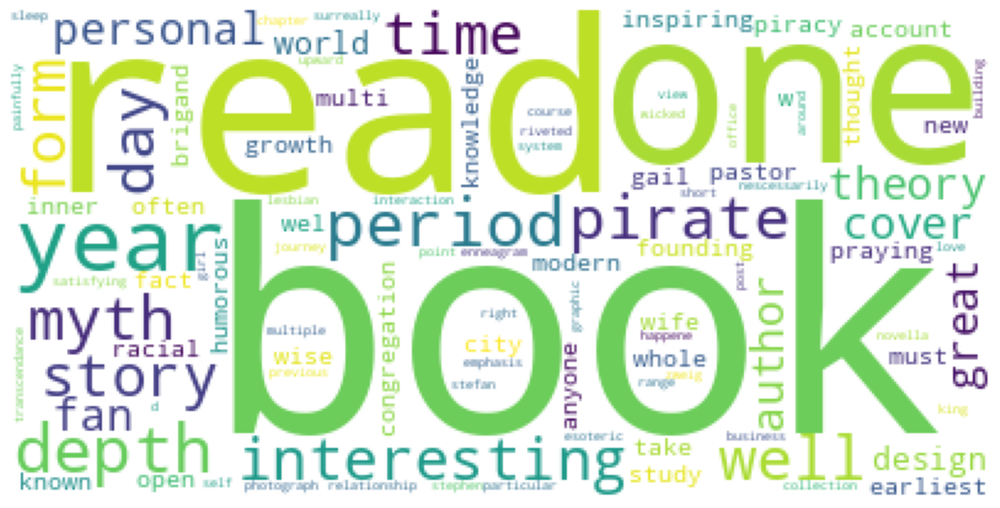

In [347]:
nonfiction_review = df_train[df_train['fiction_category'] == 0].copy() 

wordcloudnonfiction = WordCloud(max_words=100,  background_color='White', random_state=5).generate(str(nonfiction_review['text_clean']))

fig = plt.figure(figsize=(15,12))

plt.axis('off')

plt.imshow(wordcloudnonfiction)

plt.show()

More Used words on Reviews for fiction includes: design, modern, myth, racial, personal, inspiring, wife, piracy, bussiness, knowledge

Analysis of the text by Lenght

In [348]:
long_reviews = df_train[df_train['text_clean'].str.len() > 2000].copy()

len(long_reviews)

373

In [349]:
long_reviews.describe().T

,count,mean,std,min,25%,50%,75%,max
fiction_category,373.0,0.335121,0.472667,0.000000,0.000000,0.000000,1.000000,1.000000
top_publisher,373.0,0.327078,0.469776,0.000000,0.000000,0.000000,1.000000,1.000000
helpfulness,373.0,0.596691,0.404585,0.000000,0.222723,0.329681,1.000000,1.000000
compound_sentiment,373.0,1.779083,1.944207,-3.597344,1.293729,2.446032,3.159083,4.605120
text_complexity,373.0,10.496783,2.612314,4.700000,8.700000,10.200000,12.100000,22.300000
word_count,373.0,3.865732,0.118160,3.693378,3.778315,3.838058,3.928853,4.326984
review,373.0,4.037534,1.186250,1.000000,3.000000,4.000000,5.000000,5.000000


- Sentiment for long reviews
    - Given than the mean is less than the median, compound_sentiment is skewed to the left. Compound sentiment is relatively low  (Q1 = 1.25 , Q2=2.45, Q3=3.15 and mean= 1.76).

- Complexity for long reviews:
    -Given than the mean is grather than the median, text_complexity is skewed to the left.

In [350]:
short_reviews = df_train[df_train['text_clean'].str.len() < 200].copy()

short_reviews.describe().T

,count,mean,std,min,25%,50%,75%,max
fiction_category,5310.0,0.467797,0.499009,0.000000,0.000000,0.000000,1.000000,1.000000
top_publisher,5310.0,0.307910,0.461672,0.000000,0.000000,0.000000,1.000000,1.000000
helpfulness,5310.0,0.766807,0.397999,0.000000,0.286286,1.000000,1.000000,1.000000
compound_sentiment,5310.0,0.919415,0.671107,-2.043879,0.518705,1.008160,1.403008,2.758726
text_complexity,5310.0,5.560829,2.862197,-3.100000,3.700000,5.200000,7.100000,25.900000
word_count,5310.0,2.217611,0.262932,0.000000,2.055035,2.244934,2.445317,2.703420
review,5310.0,4.352354,1.106986,1.000000,4.000000,5.000000,5.000000,5.000000


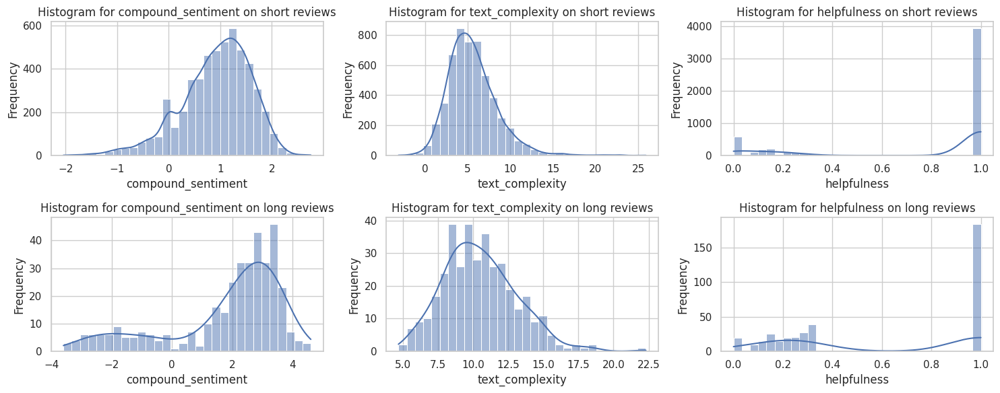

In [351]:
columns_to_plot = ['compound_sentiment', 'text_complexity', 'helpfulness']

fig, axes = plt.subplots(nrows=2, ncols=len(columns_to_plot), figsize=(15, 6))

for i, column in enumerate(columns_to_plot):
    sns.histplot(short_reviews[column], bins=30, kde=True, ax=axes[0,i])
    axes[0,i].set_title(f'Histogram for {column} on short reviews')
    axes[0,i].set_xlabel(column)
    axes[0,i].set_ylabel('Frequency')
    sns.histplot(long_reviews[column], bins=30, kde=True, ax=axes[1,i])
    axes[1,i].set_title(f'Histogram for {column} on long reviews')
    axes[1,i].set_xlabel(column)
    axes[1,i].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

# Multivariable Analysis

In [352]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12588 entries, 3268 to 2317
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   fiction_category    12588 non-null  int64  
 1   top_publisher       12588 non-null  int64  
 2   helpfulness         12588 non-null  float64
 3   text_clean          12588 non-null  object 
 4   compound_sentiment  12588 non-null  float64
 5   text_complexity     12588 non-null  float64
 6   word_count          12588 non-null  float64
 7   review              12588 non-null  float64
dtypes: float64(5), int64(2), object(1)
memory usage: 885.1+ KB


In [353]:
df_train.select_dtypes('number').corr().style.background_gradient(cmap='Blues')

,fiction_category,top_publisher,helpfulness,compound_sentiment,text_complexity,word_count,review
fiction_category,1.000000,0.231224,0.096629,0.013946,-0.160482,-0.056896,-0.024407
top_publisher,0.231224,1.000000,-0.009044,-0.033766,-0.042463,-0.004373,-0.018436
helpfulness,0.096629,-0.009044,1.000000,0.113033,-0.068141,-0.103116,0.318529
compound_sentiment,0.013946,-0.033766,0.113033,1.000000,0.038851,0.233421,0.248941
text_complexity,-0.160482,-0.042463,-0.068141,0.038851,1.000000,0.504585,-0.049718
word_count,-0.056896,-0.004373,-0.103116,0.233421,0.504585,1.000000,-0.123922
review,-0.024407,-0.018436,0.318529,0.248941,-0.049718,-0.123922,1.000000


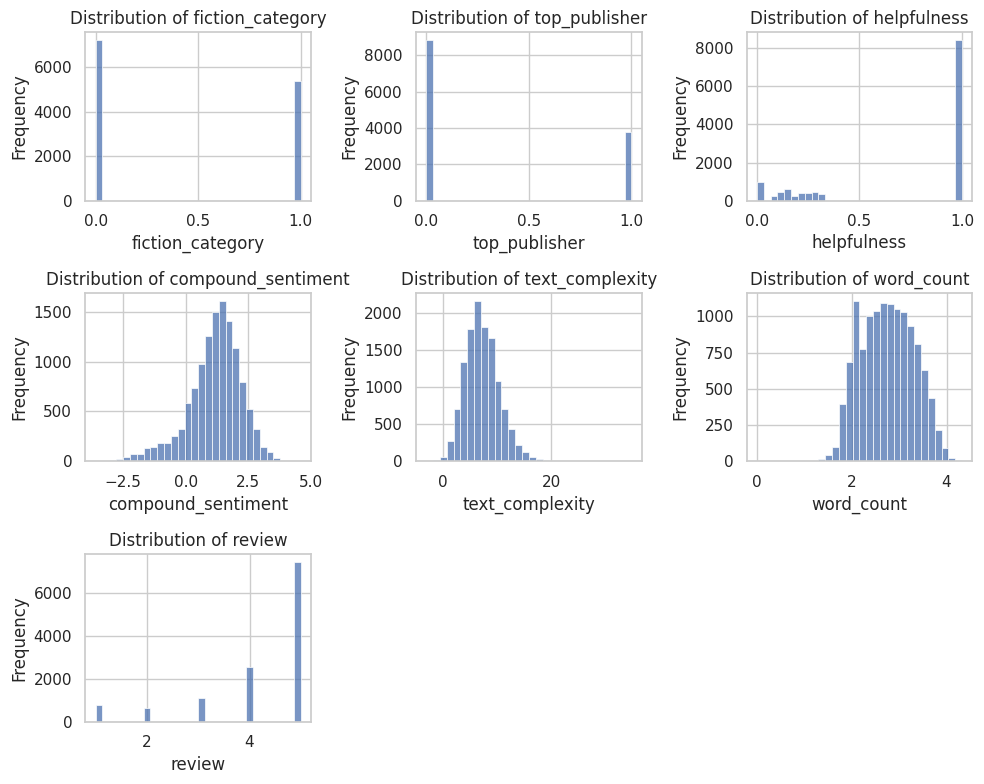

In [402]:
#Histogram with SNS

numerical_features = df_train.select_dtypes(include=['float64', 'int64']).columns

plt.figure(figsize=(10, 8))

for i, feature in enumerate(numerical_features, 1):
    plt.subplot(len(numerical_features)//3 + 1, 3, i)
    sns.histplot(df_train[feature], kde=False, bins=30)
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

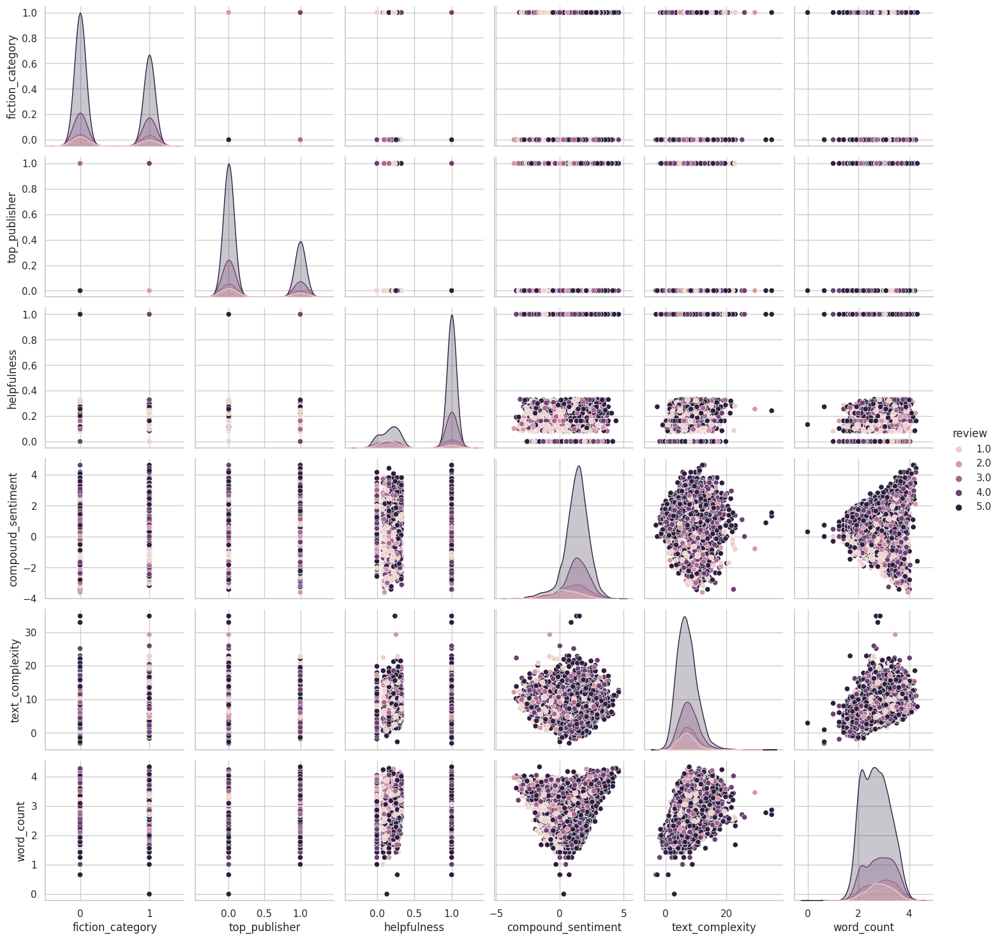

In [355]:
sns.pairplot(data=df_train, hue='review')
plt.show()

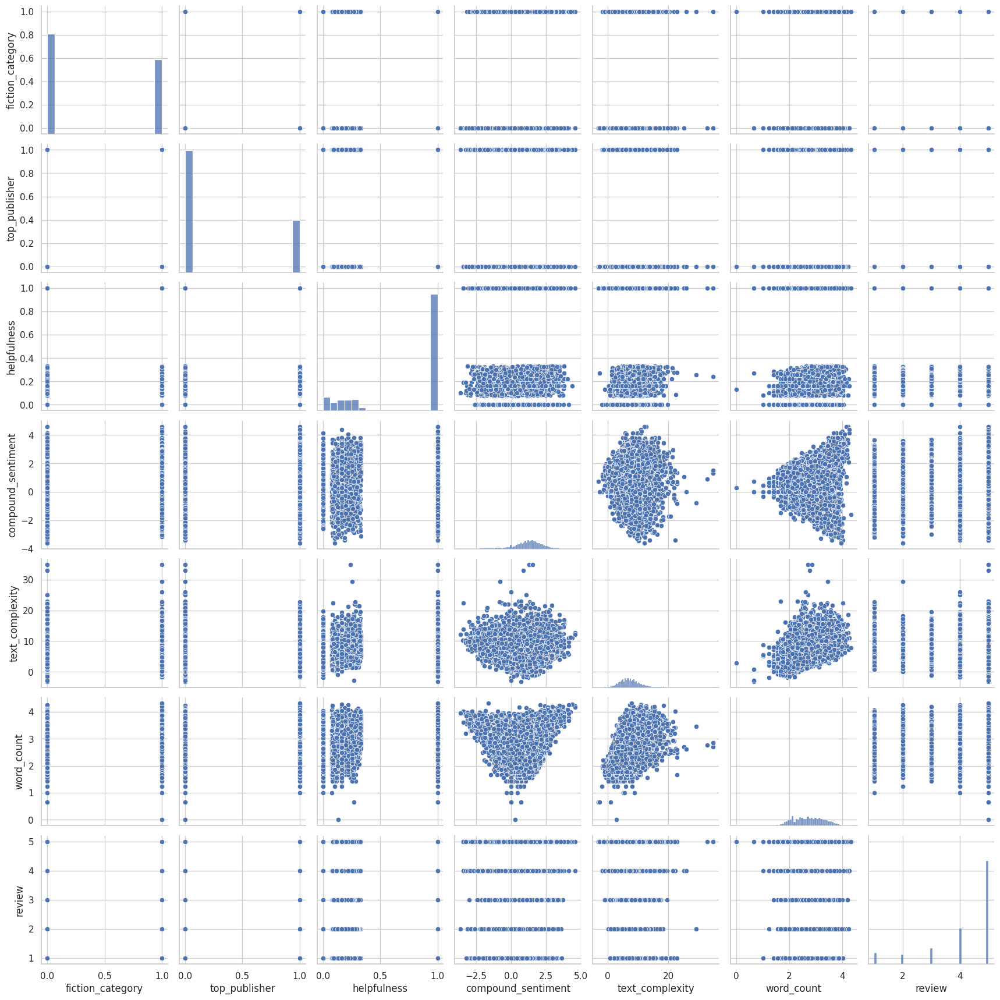

In [356]:
sns.pairplot(data=df_train)
plt.show()

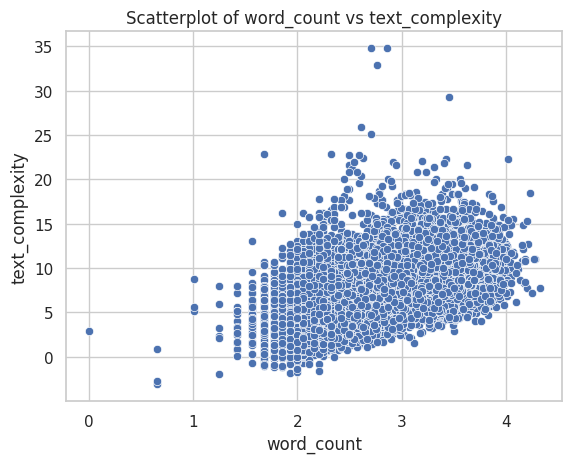

In [357]:
sns.scatterplot(data=df_train, x='word_count', y='text_complexity')
plt.title('Scatterplot of word_count vs text_complexity')
plt.show()

As the word count of the word increases, the text complexity increase

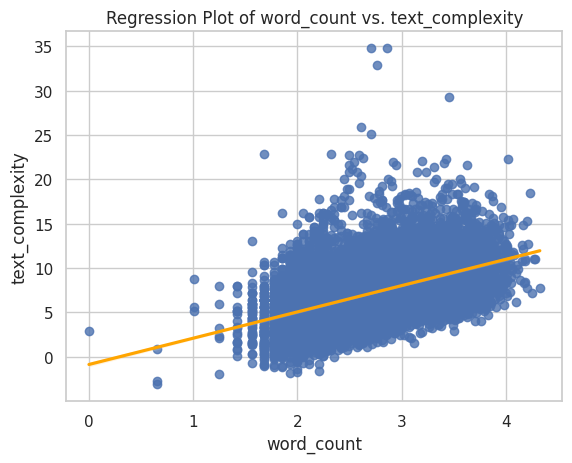

In [358]:
# Create a regression plot
sns.set(style="whitegrid")
sns.regplot(data=df_train, x='word_count', y='text_complexity', line_kws={"color": "orange"})

# Add labels and title
plt.xlabel("word_count")
plt.ylabel("text_complexity")
plt.title("Regression Plot of word_count vs. text_complexity")

# Show the plot
plt.show()

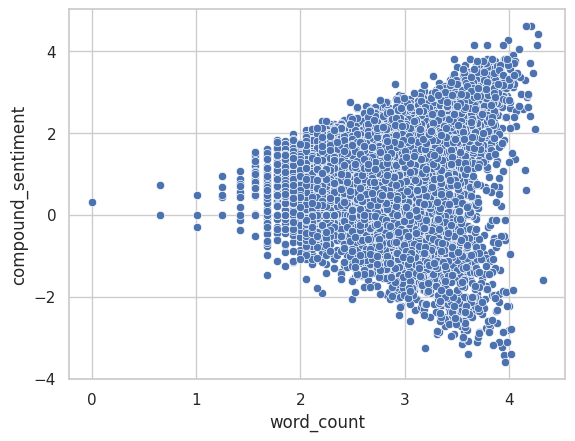

In [359]:
sns.scatterplot(data=df_train, x='word_count', y='compound_sentiment')
plt.show()

For text with less quantity of words, the sentiment tends to be more Neutral. And it tends to be more postive or negative as the word count increases.

# Model Selection, Training and Testing

- The current project is a regression exercise for predicting a continous value for the Review Score of the Review.
- The dataset contains multiple features. Some of the Categorical which are Cateogorical. 
- The dataset contains numerical features, where we have discrete variables and continuos variables.
- Lastly, the dataset contains a text column that will be vectorized.

- Categories and Publisher will be processed with One Hot Encoding

## Column Transformations

In [360]:
X_train = df_train.drop(['review'], axis=1)

In [362]:
# Preprocessing for text data
text_vectorizer = TfidfVectorizer()
text_features_train = text_vectorizer.fit_transform(X_train['text_clean'])
text_features_test = text_vectorizer.transform(X_test['text_clean'])

In [363]:
text_features_train

<12588x42784 sparse matrix of type '<class 'numpy.float64'>'
	with 677157 stored elements in Compressed Sparse Row format>

In [373]:
pca_n_components = 15

In [364]:
pca = PCA(n_components=pca_n_components, random_state=2109)

In [365]:
text_features_train_pcaed = pca.fit_transform(text_features_train.toarray())
text_features_test_pcaed = pca.transform(text_features_test.toarray())

In [366]:
text_features_train_pcaed

array([[-0.01206769, -0.01845315,  0.00513848, ...,  0.05985548,
         0.01194247, -0.02565752],
       [-0.03670426,  0.03121501, -0.04892196, ...,  0.01626524,
        -0.01370364, -0.00894821],
       [-0.06584199, -0.02985377,  0.0147604 , ...,  0.02318482,
         0.00587259,  0.00999453],
       ...,
       [-0.02254515,  0.00277917, -0.00225864, ...,  0.01476708,
        -0.01897991, -0.04073295],
       [-0.02643   , -0.07780661,  0.06767179, ..., -0.02986047,
         0.02237899, -0.03679973],
       [-0.06659223, -0.00183789, -0.0056455 , ..., -0.01302564,
         0.01330096, -0.01985537]])

In [371]:
numerical_features_nonscaled_train = X_train[['helpfulness', 'compound_sentiment','text_complexity','word_count','fiction_category','top_publisher']]
numerical_features_nonscaled_test = X_test[['helpfulness', 'compound_sentiment','text_complexity','word_count','fiction_category','top_publisher']]

In [385]:
pca_names =[]
for i in range(pca_n_components):
    pca_names.append('pca_'+str(i))
pca_names = np.array(pca_names)

In [392]:
feature_names =  np.concatenate([pca_names, numerical_features_nonscaled_train.columns])
feature_names

array(['pca_0', 'pca_1', 'pca_2', 'pca_3', 'pca_4', 'pca_5', 'pca_6',
       'pca_7', 'pca_8', 'pca_9', 'pca_10', 'pca_11', 'pca_12', 'pca_13',
       'pca_14', 'helpfulness', 'compound_sentiment', 'text_complexity',
       'word_count', 'fiction_category', 'top_publisher'], dtype=object)

In [388]:
X_train_final = np.concatenate((text_features_train_pcaed, numerical_features_nonscaled_train.values), axis=1)
X_test_final = np.concatenate((text_features_test_pcaed, numerical_features_nonscaled_test.values), axis=1)

In [389]:
X_train_final.shape

(12588, 21)

## Random Forest Model

In [390]:
from sklearn.ensemble import RandomForestRegressor
model_rf = RandomForestRegressor()

In [391]:
model_rf.fit(X_train_final, y_train)

RandomForestRegressor()

In [393]:
# Get feature importances
feature_importances = model_rf.feature_importances_

# Sort the features by importance
sorted_features = sorted(zip(feature_names, feature_importances), key=lambda x: x[1], reverse=True)

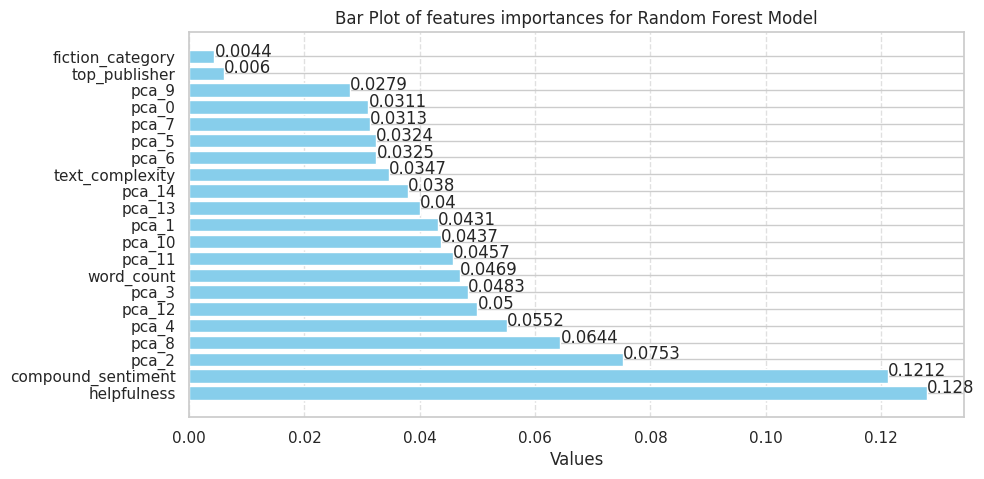

In [425]:
labels, values = zip(*sorted_features)

# Rounding values to 5 digits
values = [round(val, 4) for val in values]

# Plotting the bar chart
plt.figure(figsize=(10, 5))
plt.barh(labels, values, color='skyblue')
plt.xlabel('Values')
plt.title('Bar Plot of features importances for Random Forest Model')
plt.grid(axis='x', linestyle='--', alpha=0.6)

# Display the values on each bar
for index, value in enumerate(values):
    plt.text(value, index, str(value))

plt.show()

In [395]:
y_hat_rfr = model_rf.predict(X_test_final)
y_hat_rfr

array([4.06, 4.58, 4.45, ..., 4.45, 4.47, 3.25])

In [396]:
print(f"Random Forest Regressor: Root Mean squared error: {np.sqrt(mean_squared_error(y_test, y_hat_rfr)):.4f}")
print(f"Random Forest Regressor: Coefficient of determination: {r2_score(y_test, y_hat_rfr):.4f}")

Random Forest Regressor: Mean squared error: 1.0161
Random Forest Regressor: Coefficient of determination: 0.2759


In [401]:
#Tunning Random Forest Model
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10]    
}
grid_search = GridSearchCV(estimator=model_rf, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search.fit(X_train_final, y_train)

best_params = grid_search.best_params_

In [403]:
best_params

{'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 200}

In [ ]:
best_rf = grid_search.best_estimator_
y_pred_best_rf = best_rf.predict(X_test_final)

In [405]:
model_rf_best = RandomForestRegressor(max_depth= 10, min_samples_split= 2, n_estimators= 200, random_state=5)
model_rf_best.fit(X_train_final, y_train)

RandomForestRegressor(max_depth=10, n_estimators=200, random_state=5)

In [406]:
y_hat_rfr_best = model_rf_best.predict(X_test_final)
y_hat_rfr_best

array([3.92140262, 4.66052007, 4.49301951, ..., 4.48447629, 4.62023153,
       3.71473292])

In [407]:
print(f"Random Forest Regressor with Tunning: Root Mean squared error: {np.sqrt(mean_squared_error(y_test, y_hat_rfr_best)):.4f}")
print(f"Random Forest Regressor with Tunning: Coefficient of determination: {r2_score(y_test, y_hat_rfr_best):.4f}")

Random Forest Regressor with Tunning: Root Mean squared error: 1.0069
Random Forest Regressor with Tunning: Coefficient of determination: 0.2889


## Linear Regression Model

In [408]:
model_linear_reg = LinearRegression()
model_linear_reg.fit(X_train_final, y_train)

LinearRegression()

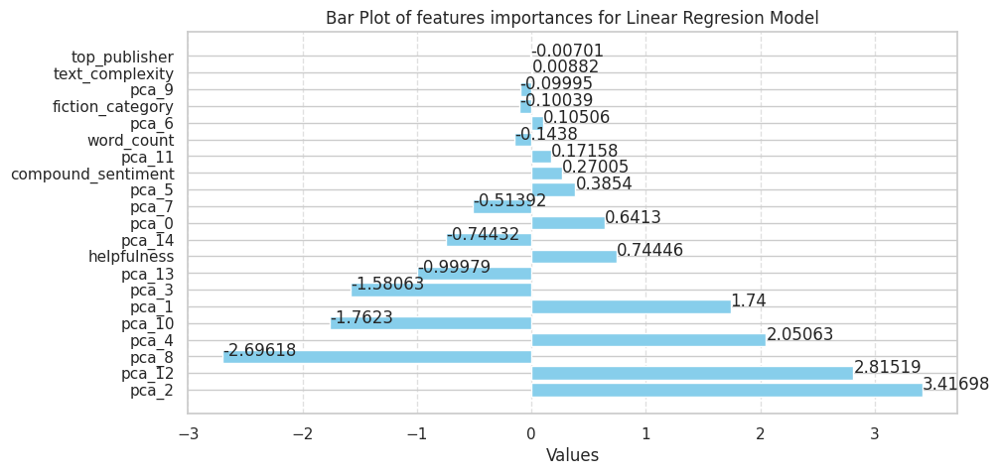

In [421]:
feature_coefficients = model_linear_reg.coef_

# Sort the features by coefficient magnitude
sorted_features = sorted(zip(feature_names, feature_coefficients), key=lambda x: abs(x[1]), reverse=True)

labels, values = zip(*sorted_features)

# Rounding values to 5 digits
values = [round(val, 5) for val in values]

# Plotting the bar chart
plt.figure(figsize=(10, 5))
plt.barh(labels, values, color='skyblue')
plt.xlabel('Values')
plt.title('Bar Plot of features importances for Linear Regresion Model')
plt.grid(axis='x', linestyle='--', alpha=0.6)

# Display the values on each bar
for index, value in enumerate(values):
    plt.text(value, index, str(value))

plt.show()

In [410]:
y_hat_lr = model_linear_reg.predict(X_test_final)
y_hat_lr

array([4.10497232, 4.89946012, 4.41007536, ..., 4.72252041, 5.1634392 ,
       3.84303806])

In [411]:
print(f'Beta0: {model_linear_reg.intercept_}, Beta1: {model_linear_reg.coef_[0]}')

Beta0: 3.7318040423965484, Beta1: 0.6413037204444011


In [412]:
print(f"Linear Regression: Mean squared error: {mean_squared_error(y_test, y_hat_lr):.4f}")
print(f"Linear Regression: Coefficient of determination: {r2_score(y_test, y_hat_lr):.4f}")

Linear Regression: Mean squared error: 1.0751
Linear Regression: Coefficient of determination: 0.2460


## Decision Tree Regressor Model

In [413]:
model_dtr = DecisionTreeRegressor()
model_dtr.fit(X_train_final, y_train)

DecisionTreeRegressor()

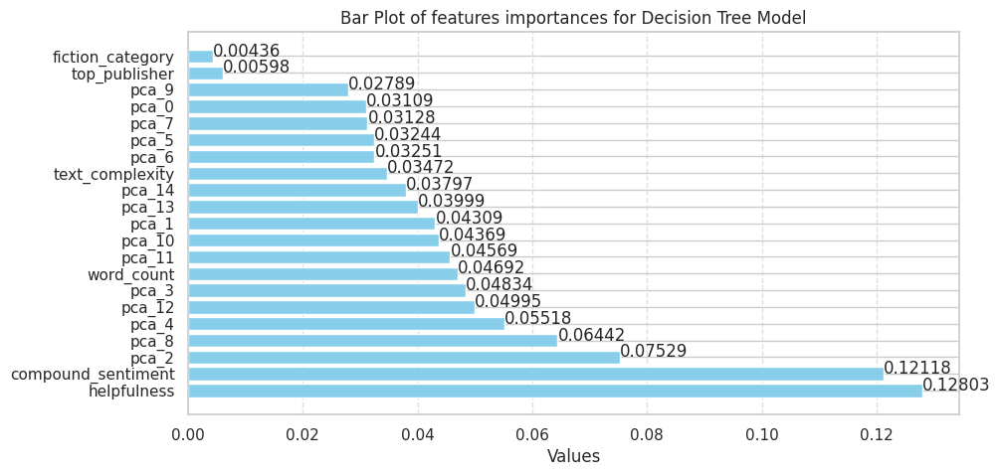

In [422]:
feature_importances = model_dtr.feature_importances_

# Sort the features by importance
sorted_features = sorted(zip(feature_names, feature_importances), key=lambda x: x[1], reverse=True)

labels, values = zip(*sorted_features)

# Rounding values to 5 digits
values = [round(val, 5) for val in values]

# Plotting the bar chart
plt.figure(figsize=(10, 5))
plt.barh(labels, values, color='skyblue')
plt.xlabel('Values')
plt.title('Bar Plot of features importances for Decision Tree Model')
plt.grid(axis='x', linestyle='--', alpha=0.6)

# Display the values on each bar
for index, value in enumerate(values):
    plt.text(value, index, str(value))

plt.show()

In [415]:
y_hat_dtr = model_dtr.predict(X_test_final)
y_hat_dtr

array([3., 5., 5., ..., 5., 5., 3.])

In [416]:
print(f"Decision Tree Regressor: Mean squared error: {np.sqrt(mean_squared_error(y_test, y_hat_dtr)):.4f}")
print(f"Decision Tree Regressor: Coefficient of determination: {r2_score(y_test, y_hat_dtr):.4f}")

Decision Tree Regressor: Mean squared error: 1.4440
Decision Tree Regressor: Coefficient of determination: -0.4624


## Neural Network Model